# **DETERMINATION OF MEMBERSHIP, CLUSTER AND CLUSTER CENTRE FOR M67 USING HDBSCAN, PLOTTING COLOR MAGNITUDE DIAGRAM AND FITTING ISOCHRONE** 

---

## 1. Introduction

<p align = "justify"> Open clusters have long been regarded as powerful tools for studies of the Galactic disk and evolution of stars (Chen, 2003). Membership determination is the first step to study an open cluster, which can directly influence estimation of physical parameters. Various methods have been used for membership determination based on proper motions, radial velocities, photometric data and their combination.
</p>
<p align = "justify"> Various algorithms have been developed for the determination of star cluster membership. Machine-learning applications for this case were introduced such as DBSCAN (Gao, 2014), Gaussian Mixture Model (Gao, 2020), KMEANS (El Aziz et al. 2016), k-th nearest neighbor (Gao, 2016), ML-MOC (Agarwal et al. 2021) and many more.
</p>

## 2. Objectives

<p align = "justify"> Aims of the workshop are:
<ol type="1">
<li>to determine the center of the open cluster; and</li>
<li>to determine the membership probability.</li> 
</ol>
</p>

## 3. Theoretical Background

<p align = "justify"> Hierarchical Density-Based Spatial Clustering of Applications with Noise (HDBSCAN) is a natural evolution of DBSCAN released in the past few years, almost 20 years after DBSCAN (Ester et al. 1996). DBSCAN identifies clusters as overdensities in a multi-dimensional space in which the number of sources exceeds the required minimum number of points within a neighborhood (minPts) of a particular linking length ε. </p>


<figure>
  <img src="https://miro.medium.com/max/1087/0*bUyZlx3rbNneiUA_" alt="Trulli" width = "500px">
  <figcaption align="left"> Fig 1. Illustration of DBSCAN (source: medium.com/@agarwalvibhor84). </figcaption> 
</figure>

<p align = "justify"> HDBSCAN works in a similar way except the user only needs to set a minimum cluster size. It does not depend on ε; instead it condenses the minimum spanning tree by pruning off the nodes that do not meet the minimum number of sources in a cluster, and reanalyzing the nodes that do (Kounkel & Covey, 2019). Not only does it automatically determine other things to set a density threshold accurately, it also does this on local levels, meaning that clusters can be returned in different areas of a dataset with different density levels. </p>

## 4. Data

<p align = "justify"> The data that will be used is from Gaia Early Data Release 3 (Gaia eDR3, Gaia Collaboration 2016b; 2020a). The third early data release (eDR3, Gaia Collaboration et al. 2018) of the ESA Gaia space mission (Gaia Collaboration et al. 2016b) is by far the deepest and most precise astrometric catalogue ever obtained, with proper motion nominal uncertainties a hundred times smaller than UCAC4 and PPMXL. 
</p>

<p align = "justify"> We download sources from Gaia eDR3 in a cone around the cluster centre for a value of radius that is greater than the tidal radius of the cluster. Though our algorithm is quite robust to the choice of this initial radius, we download sources within a radius of 180 arcmin from the cluster centre. Next, we select the sources that satisfy the following criteria (Agarwal et al. 2021):
<ol type="1">
<li>Each source must have the five astrometric parameters, positions, proper motions, and parallax as well as valid measurements in the three photometric passbands G, GBP, and GRP in the Gaia eDR3 catalogue.</li>
<li>Their parallax values must be non-negative.</li>
<li>To eliminate sources with high uncertainty while still retaining a fraction of sources down to G ∼ 21 mag, the errors in their G-mag must be less than 0.005.</li>
</ol>
</p>

You can download NGC 752 data [here](https://drive.google.com/file/d/1krYBlajvirNH5L_1GXfxUIxbeMZoKpUT/view?usp=sharing).

## 5. Workshop Structure

<p align = "justify"> The workshop is made up of two Jupyter Notebooks. The layout of the workshop is as follows:
<ol type="1">
<li>Determine the center of the open cluster.</li>
<li>Determine the membership probability.</li>
</ol>
</p>

<p align = "justify"> Our membership assignment relies on the astrometric solution, and we only used the Gaia eDR3 photometry to manually confirm that the groups identified matched the expected aspect of a cluster in a color-magnitude diagram.
</p>

### Part 1: Determine the Center of the Open Cluster

To determine the membership of open cluster NGC 752, we will use a module in python called [hdbscan](https://hdbscan.readthedocs.io/en/latest/) (McInnes et al. 2017). If this notebook is run on gColab, firstly we need to install some libraries.

Import the required packages

In [1]:

import math
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import hdbscan
from sklearn.preprocessing import StandardScaler
from astropy.coordinates import SkyCoord
import astropy.units as u

from sklearn.mixture import GaussianMixture
import arviz as az
from patsy import dmatrix
import statsmodels.formula.api as smf
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from __future__ import print_function

Set some plotting configurations

In [2]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=10)            # legend fontsize

%matplotlib inline



---


#### Data Preparation



Import data file

In [3]:
FILENAME = "/Users/esanmoulighosh/Astrostat_IVC/gaiaedr3_150_M67.csv"
datafile = pd.read_csv(FILENAME, delimiter=",") 
datafile

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,...,phot_g_mean_flux_error,phot_g_mean_mag,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,dr2_radial_velocity,dr2_radial_velocity_error
0,603712422876575360,135.110808,0.179466,10.726941,0.144282,0.286789,0.189191,1.515865,1.814069,-0.675509,...,1.200222,18.423365,394.940086,7.716585,18.847214,574.873237,6.093434,17.848965,NaN,NaN
1,603712427171528448,135.118378,0.223748,10.723134,0.181216,0.051501,0.257076,0.200335,6.170623,-5.506968,...,22.767496,15.028518,9540.077355,15.731504,15.389663,13160.737711,19.746544,14.449695,NaN,NaN
2,603712457236324224,135.121338,0.523702,10.738075,0.395677,-0.012734,0.626520,-0.020324,14.416777,4.077665,...,0.745875,20.152782,72.474297,6.497540,20.688082,138.347415,8.024095,19.395468,NaN,NaN
3,603712560315544576,135.130346,0.903004,10.744922,0.761642,0.781963,0.969796,0.806316,1.470843,-0.476772,...,0.728559,20.612862,44.232127,6.761984,21.224197,102.227884,8.291773,19.723972,NaN,NaN
4,603713041351907200,135.140797,0.335336,10.772432,0.245219,0.951278,0.423789,2.244700,8.649885,-8.469014,...,30.743560,16.465595,2937.308732,11.487564,16.668669,4254.577059,11.557065,15.675755,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115665,603622950118859520,135.003350,1.049273,10.782234,0.879750,0.584927,1.131570,0.516916,10.016977,-9.962210,...,0.874115,20.763254,46.211559,6.517455,21.176666,119.069104,11.354191,19.558397,NaN,NaN
115666,603623018837269632,134.996200,0.473971,10.786565,0.392199,-0.134166,0.499585,-0.268555,4.335729,-4.332591,...,0.802039,20.045258,93.905349,10.996089,20.406816,168.347676,7.198842,19.182377,NaN,NaN
115667,603623018837270016,134.986138,0.489632,10.790086,0.348764,1.001567,0.589709,1.698409,17.389887,-11.889237,...,0.666937,20.240751,41.277856,5.681590,21.299250,190.096579,7.743901,19.050459,NaN,NaN
115668,603623053197008512,134.998781,0.346450,10.791484,0.283039,0.518023,0.360595,1.436578,8.223231,0.620460,...,0.799754,19.531996,93.553167,7.192426,20.410896,274.355026,7.375343,18.652113,NaN,NaN


In [4]:
datafile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115670 entries, 0 to 115669
Data columns (total 24 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   source_id                  115670 non-null  int64  
 1   ra                         115670 non-null  float64
 2   ra_error                   115670 non-null  float64
 3   dec                        115670 non-null  float64
 4   dec_error                  115670 non-null  float64
 5   parallax                   95584 non-null   float64
 6   parallax_error             95584 non-null   float64
 7   parallax_over_error        95584 non-null   float64
 8   pm                         95584 non-null   float64
 9   pmra                       95584 non-null   float64
 10  pmra_error                 95584 non-null   float64
 11  pmdec                      95584 non-null   float64
 12  pmdec_error                95584 non-null   float64
 13  phot_g_mean_flux           11

Handling the missing values 

In [5]:
datafile.dropna(subset=['pmra', 'pmdec', 'parallax']).reset_index()

,index,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,...,phot_g_mean_flux_error,phot_g_mean_mag,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,dr2_radial_velocity,dr2_radial_velocity_error
0,0,603712422876575360,135.110808,0.179466,10.726941,0.144282,0.286789,0.189191,1.515865,1.814069,...,1.200222,18.423365,394.940086,7.716585,18.847214,574.873237,6.093434,17.848965,NaN,NaN
1,1,603712427171528448,135.118378,0.223748,10.723134,0.181216,0.051501,0.257076,0.200335,6.170623,...,22.767496,15.028518,9540.077355,15.731504,15.389663,13160.737711,19.746544,14.449695,NaN,NaN
2,2,603712457236324224,135.121338,0.523702,10.738075,0.395677,-0.012734,0.626520,-0.020324,14.416777,...,0.745875,20.152782,72.474297,6.497540,20.688082,138.347415,8.024095,19.395468,NaN,NaN
3,3,603712560315544576,135.130346,0.903004,10.744922,0.761642,0.781963,0.969796,0.806316,1.470843,...,0.728559,20.612862,44.232127,6.761984,21.224197,102.227884,8.291773,19.723972,NaN,NaN
4,4,603713041351907200,135.140797,0.335336,10.772432,0.245219,0.951278,0.423789,2.244700,8.649885,...,30.743560,16.465595,2937.308732,11.487564,16.668669,4254.577059,11.557065,15.675755,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95579,115665,603622950118859520,135.003350,1.049273,10.782234,0.879750,0.584927,1.131570,0.516916,10.016977,...,0.874115,20.763254,46.211559,6.517455,21.176666,119.069104,11.354191,19.558397,NaN,NaN
95580,115666,603623018837269632,134.996200,0.473971,10.786565,0.392199,-0.134166,0.499585,-0.268555,4.335729,...,0.802039,20.045258,93.905349,10.996089,20.406816,168.347676,7.198842,19.182377,NaN,NaN
95581,115667,603623018837270016,134.986138,0.489632,10.790086,0.348764,1.001567,0.589709,1.698409,17.389887,...,0.666937,20.240751,41.277856,5.681590,21.299250,190.096579,7.743901,19.050459,NaN,NaN
95582,115668,603623053197008512,134.998781,0.346450,10.791484,0.283039,0.518023,0.360595,1.436578,8.223231,...,0.799754,19.531996,93.553167,7.192426,20.410896,274.355026,7.375343,18.652113,NaN,NaN


To eliminate sources with high uncertainty while still retaining a fraction of sources down to G ∼ 21 mag, we need to select the errors in their G-mag must be less than 0.005. Calculate error of G ($|\sigma_G|$), G$_{BP}$ ($|\sigma_{BP}|$), and G$_{RP}$ ($|\sigma_{RP}|$).

\begin{eqnarray}
|\sigma_G| = -\frac{2.5}{ln \ 10} \frac{\sigma_{F_G}}{F_G} \\
|\sigma_{BP}| = -\frac{2.5}{ln \ 10} \frac{\sigma_{F_{BP}}}{F_{BP}} \\
|\sigma_{RP}| = -\frac{2.5}{ln \ 10} \frac{\sigma_{F_{RP}}}{F_{RP}}
\end{eqnarray}

Adding 5 more columns named e_Gmag, e_BPmag, e_RPmag and bp_rp (to plot color-magnitude easily)

In [6]:
datafile['e_Gmag'] = abs(-2.5*datafile['phot_g_mean_flux_error']/math.log(10)/datafile['phot_g_mean_flux'])
datafile['e_BPmag'] = abs(-2.5*datafile['phot_bp_mean_flux_error']/math.log(10)/datafile['phot_bp_mean_flux'])
datafile['e_RPmag'] = abs(-2.5*datafile['phot_rp_mean_flux_error']/math.log(10)/datafile['phot_rp_mean_flux'])
datafile['bp_rp'] = datafile['phot_bp_mean_mag'] - datafile['phot_rp_mean_mag']
datafile['parallax_over_error'] = datafile['parallax'] / datafile['parallax_error']

Select data with positive parallax value ($\omega>0$) and error of G magnitude ($\sigma_G$) $< 0.005$.

In [7]:
pprocessdata = datafile[(datafile['parallax'] > 0) & (datafile['e_Gmag'] < 0.005)].reset_index(drop=True)
pprocessdata 

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,...,phot_bp_mean_mag,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,dr2_radial_velocity,dr2_radial_velocity_error,e_Gmag,e_BPmag,e_RPmag,bp_rp
0,603712422876575360,135.110808,0.179466,10.726941,0.144282,0.286789,0.189191,1.515865,1.814069,-0.675509,...,18.847214,574.873237,6.093434,17.848965,NaN,NaN,0.001620,0.021214,0.011508,0.998249
1,603712427171528448,135.118378,0.223748,10.723134,0.181216,0.051501,0.257076,0.200335,6.170623,-5.506968,...,15.389663,13160.737711,19.746544,14.449695,NaN,NaN,0.001347,0.001790,0.001629,0.939968
2,603715588267458176,135.105567,0.031968,10.754417,0.023291,0.644799,0.041918,15.382289,8.081793,-0.661945,...,15.448242,10779.170921,9.873325,14.666432,NaN,NaN,0.000280,0.001505,0.000994,0.781810
3,603715618332282624,135.119952,0.312882,10.770758,0.246001,1.459228,0.360624,4.046393,9.155590,-8.466374,...,20.016289,293.282890,7.710674,18.579680,NaN,NaN,0.002747,0.071853,0.028545,1.436609
4,603715622627196288,135.120392,0.016787,10.761850,0.012744,2.166628,0.020867,103.832520,15.660868,-15.391311,...,14.245265,37084.941878,30.516487,13.324902,NaN,NaN,0.000179,0.000717,0.000893,0.920363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70360,603622847038577280,134.983284,0.238657,10.768340,0.175209,0.577788,0.297446,1.942501,6.121636,-4.914994,...,19.841171,272.376897,6.706917,18.659970,NaN,NaN,0.002581,0.043561,0.026735,1.181201
70361,603622881398315520,134.968256,0.477930,10.767039,0.351956,0.068398,0.615982,0.111038,1.294598,-0.312259,...,21.146313,196.936992,5.951191,19.012077,NaN,NaN,0.004794,0.113976,0.032810,2.134236
70362,603622881398315776,134.965021,0.359085,10.770651,0.256683,0.671293,0.436031,1.539552,3.556748,-3.469882,...,20.838999,268.732655,5.201385,18.674595,NaN,NaN,0.003475,0.101277,0.021015,2.164404
70363,603623018837270016,134.986138,0.489632,10.790086,0.348764,1.001567,0.589709,1.698409,17.389887,-11.889237,...,21.299250,190.096579,7.743901,19.050459,NaN,NaN,0.004799,0.149444,0.044229,2.248791


Select pmra, pmdec and parallax for plotting

In [8]:
df = pprocessdata[["pmra", "pmdec", "parallax"]]
df = df.to_numpy().astype("float32", copy = False)



---


####Visualization I 

Spatial Distribution

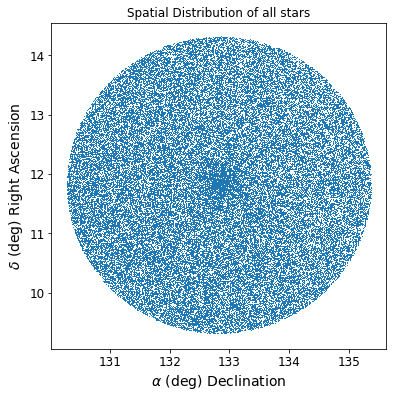

In [9]:
fig = plt.figure(figsize=(6, 6))
plt.plot(pprocessdata['ra'], pprocessdata['dec'], ',')

plt.xlabel(r'$\alpha$ (deg) Declination')
plt.ylabel(r'$\delta$ (deg) Right Ascension')
plt.title ('Spatial Distribution of all stars')

plt.show()

Vector Point Diagram

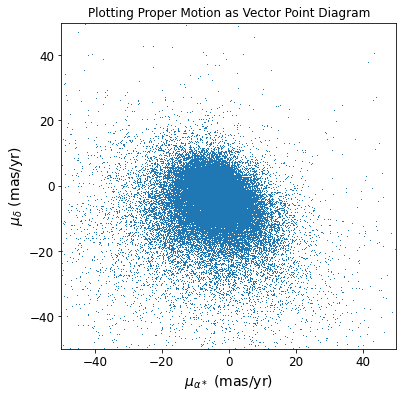

In [10]:
fig = plt.figure(figsize=(6, 6))
plt.plot(pprocessdata['pmra'], pprocessdata['pmdec'], ',')

plt.xlabel(r'$\mu_{\alpha*}$ (mas/yr)')
plt.ylabel(r'$\mu_{\delta}$ (mas/yr)')

plt.title ('Plotting Proper Motion as Vector Point Diagram')

plt.ylim(-50,50)
plt.xlim(-50,50)

plt.show()

Color Magnitude Diagram

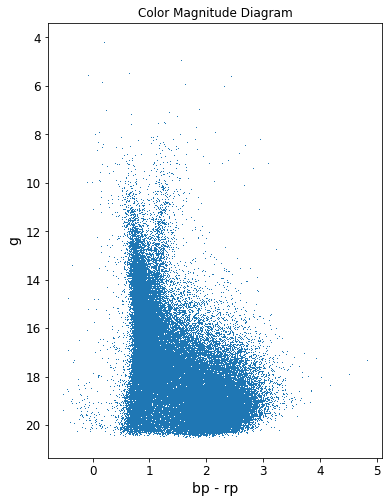

In [11]:
fig = plt.figure(figsize=(6, 8))
plt.plot(pprocessdata['bp_rp'], pprocessdata['phot_g_mean_mag'], ',')

ax = plt.gca()
ax.invert_yaxis()
#plt.xlim(0., 3.)

plt.title("Color Magnitude Diagram")

plt.xlabel('bp - rp')
plt.ylabel('g')

plt.show()

Normalize the data and run HDBSCAN

In [12]:
stscaler_df = StandardScaler().fit(df)
df_ = stscaler_df.transform(df)
clus_size = 2 * df_.shape[1]
clusterer = hdbscan.HDBSCAN(clus_size)
cluster_labels = clusterer.fit_predict(df_)

pprocessdata['hdbscan'] = cluster_labels

Vector Point Diagram for every HDBSCAN cluster

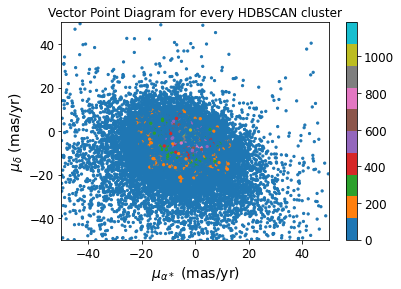

In [13]:
fig, ax = plt.subplots()#figsize=(6,6))
plot = ax.scatter(pprocessdata['pmra'], pprocessdata['pmdec'], s=5, c=pprocessdata['hdbscan'], cmap='tab10') #edgecolor='')

fig.colorbar(plot, ax=ax)
ax = plt.gca()
ax.invert_yaxis()
plt.xlim(-50,50)
plt.ylim(-50,50)
plt.title('Vector Point Diagram for every HDBSCAN cluster')
plt.xlabel(r'$\mu_{\alpha*}$ (mas/yr)')
plt.ylabel(r'$\mu_{\delta}$ (mas/yr)')

plt.show()

Distribution of stars inside each cluster and the number of members from each clustering result.

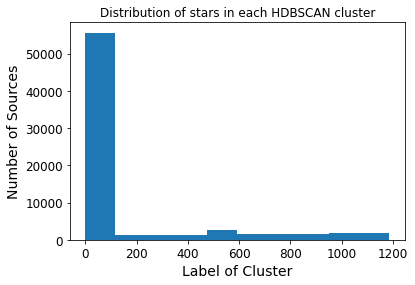

-1       54490
 537      1422
 677        84
 1143       70
 176        53
         ...  
 457         6
 258         6
 501         6
 367         6
 440         6
Name: hdbscan, Length: 1188, dtype: int64

In [14]:
plt.figure(figsize=(6, 4))
plt.hist(pprocessdata['hdbscan'])

plt.xlabel('Label of Cluster')
plt.ylabel('Number of Sources')
plt.title('Distribution of stars in each HDBSCAN cluster')

plt.show()
plt.close()

pprocessdata['hdbscan'].value_counts()

Separate the data with a label that shows the background data (`label = -1`).

In [15]:
result_hdbscan = pprocessdata[pprocessdata['hdbscan'] >= 0].reset_index(drop=True)

c = result_hdbscan['hdbscan'].value_counts()
print (c)

537     1422
677       84
1143      70
176       53
1080      51
        ... 
457        6
258        6
501        6
367        6
440        6
Name: hdbscan, Length: 1187, dtype: int64


Finding the cluster with the most number after assuming the data used only consists of the background and one stellar cluster.

In [16]:
n_max = c.index[np.argmax(c)]

result = result_hdbscan[result_hdbscan['hdbscan'] == n_max]

In [17]:
result

,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,...,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,dr2_radial_velocity,dr2_radial_velocity_error,e_Gmag,e_BPmag,e_RPmag,bp_rp,hdbscan
119,603785987076155392,134.065048,0.079601,10.469566,0.045647,1.005484,0.105191,9.558650,11.493557,-11.102049,...,1.563995e+03,8.818563,16.762306,NaN,NaN,0.000786,0.021069,0.006122,1.849257,537
372,603848521800034176,134.004906,0.020641,10.788134,0.011424,1.187326,0.027782,42.736747,11.663380,-11.295202,...,1.531924e+04,12.556026,14.284802,NaN,NaN,0.000201,0.001318,0.000890,0.936761,537
889,604003037543393920,134.634072,0.294349,11.514641,0.211292,1.021565,0.347744,2.937690,11.927180,-11.450768,...,3.496401e+02,6.705073,18.388842,NaN,NaN,0.002951,0.072723,0.020821,2.454822,537
970,604024585394575616,135.082808,0.582022,11.718627,0.392696,1.092838,0.760744,1.436537,11.465279,-11.165367,...,1.910779e+02,7.716159,19.044868,NaN,NaN,0.004975,0.134217,0.043844,1.941140,537
1159,604612549237529600,133.692016,0.015389,11.018895,0.007980,1.097347,0.022130,49.585371,11.496745,-11.121554,...,2.674957e+04,13.216236,13.679604,NaN,NaN,0.000164,0.000650,0.000536,0.815715,537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14532,597664700902078976,132.323039,0.021296,9.606395,0.012219,1.135177,0.031262,36.311286,10.874114,-10.594855,...,1.374860e+04,12.317483,14.402249,NaN,NaN,0.000191,0.001229,0.000973,0.978616,537
14777,597712426578737792,133.589252,0.013260,9.631878,0.006607,1.151925,0.017649,65.268491,10.963449,-10.699613,...,1.427709e+06,228.889100,9.361297,34.548126,0.211846,0.000116,0.000263,0.000174,1.293717,537
14825,597724757429410048,133.852332,0.481212,9.910795,0.264615,1.162087,0.669526,1.735685,11.771061,-11.337732,...,1.713989e+02,7.069042,19.162876,NaN,NaN,0.004391,0.107451,0.044779,1.771809,537
14900,597743311687984768,133.498198,0.143220,10.020892,0.084263,1.389898,0.186031,7.471329,10.944349,-10.625956,...,8.113273e+02,8.308019,17.474905,NaN,NaN,0.001391,0.043268,0.011118,2.180665,537




---


####Visualization II (Result)

Spatial Distribution

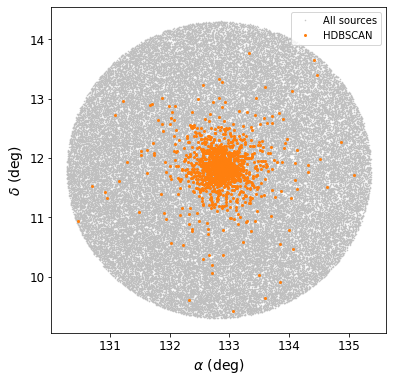

In [18]:
fig = plt.figure(figsize=(6, 6))
ax = plt.subplot()
plt.plot(pprocessdata['ra'], pprocessdata['dec'], '.', mec='silver', mfc='darkgray', markersize=1., label="All sources")
plt.plot(result['ra'], result['dec'], 'o', mfc='tab:orange', markersize=2., label="HDBSCAN")

plt.xlabel(r'$\alpha$ (deg)')
plt.ylabel(r'$\delta$ (deg)')
plt.legend()
plt.show()

Vector Point Diagram

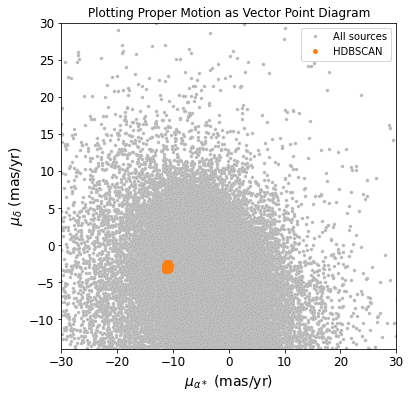

In [19]:
fig = plt.figure(figsize=(6, 6))
plt.plot(pprocessdata['pmra'], pprocessdata['pmdec'], '.', mec='silver', mfc='darkgray', markersize=5., label="All sources")
plt.plot(result['pmra'], result['pmdec'], 'o', mfc='tab:orange', mec='None', markersize=5., label="HDBSCAN")

plt.xlabel(r'$\mu_{\alpha*}$ (mas/yr)')
plt.ylabel(r'$\mu_{\delta}$ (mas/yr)')


plt.title ('Plotting Proper Motion as Vector Point Diagram')


plt.xticks()
plt.yticks()

plt.xlim(-30,30)
plt.ylim(-14,30)

plt.legend()
plt.show()

Color Magnitude Diagram

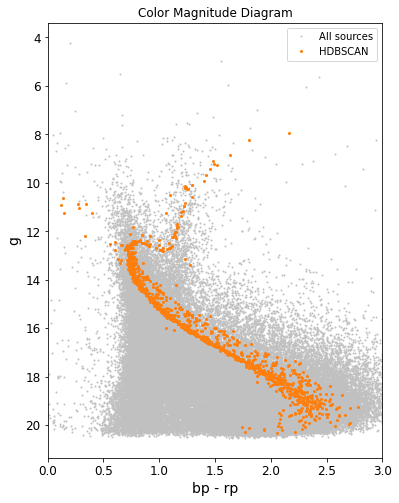

In [20]:
plt.figure(figsize=(6, 8))
plt.plot(pprocessdata['bp_rp'], pprocessdata['phot_g_mean_mag'], '.', mec='silver', mfc='darkgray', markersize=2., label="All sources")
plt.plot(result['bp_rp'], result['phot_g_mean_mag'], 'o', color='tab:orange', markersize=2., label=r"HDBSCAN")

plt.xlabel(r'$G_{BP}-G_{RP}$')
plt.ylabel(r'$G$ (mag)')

plt.xlim(0., 3.)
plt.gca().invert_yaxis()
plt.title("Color Magnitude Diagram")

plt.xlabel('bp - rp')
plt.ylabel('g')
plt.legend()
plt.show()

Parallax Distribution

In [21]:
bins_all = np.arange(pprocessdata['parallax'].min(), pprocessdata['parallax'].max(), .01)
bins_sam = np.arange(result['parallax'].min(), result['parallax'].max(), .01)

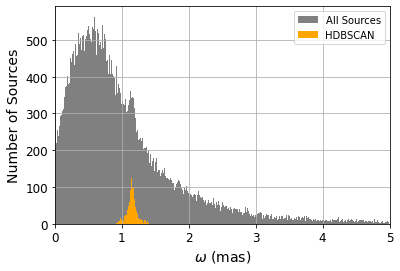

In [22]:
plt.figure(figsize=(6, 4))
pprocessdata.parallax.hist(bins=bins_all, color='gray', label="All Sources")
result.parallax.hist(bins=bins_sam, color='orange', label="HDBSCAN")

plt.xlabel(r'$\omega$ (mas)')
plt.ylabel('Number of Sources')

plt.xlim(0, 5)

plt.xticks()
plt.yticks()

plt.legend()
plt.show()

1. Determine the center of the stellar cluster

132.85333382840082 11.833583454686076 -10.960577721346269 -2.9057437851491565 1.1548866391571708 865.8858506924921


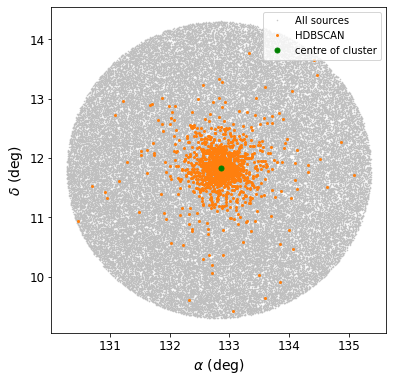

In [23]:

ra_c    = np.mean(result['ra'])
dec_c   = np.mean(result['dec'])
pmra_c  = np.mean(result['pmra'])
pmdec_c = np.mean(result['pmdec'])

parallax_mean = np.mean(result['parallax'])
distance =1000/parallax_mean

print (ra_c, dec_c, pmra_c, pmdec_c, parallax_mean,distance)

fig = plt.figure(figsize=(6, 6))
ax = plt.subplot()
plt.plot(pprocessdata['ra'], pprocessdata['dec'], '.', mec='silver', mfc='darkgray', markersize=1., label="All sources")
plt.plot(result['ra'], result['dec'], 'o', mfc='tab:orange', markersize=2., label="HDBSCAN")
plt.plot(ra_c,dec_c,'o', markersize=5, c= 'green', label='centre of cluster')
plt.xlabel(r'$\alpha$ (deg)')
plt.ylabel(r'$\delta$ (deg)')
plt.legend()
plt.show()

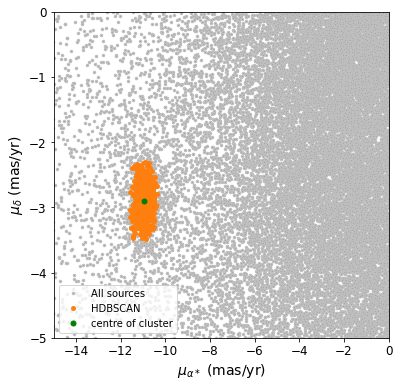

1422

In [24]:
fig = plt.figure(figsize=(6, 6))
plt.plot(pprocessdata['pmra'], pprocessdata['pmdec'], '.', mec='silver', mfc='darkgray', markersize=5., label="All sources")
plt.plot(result['pmra'], result['pmdec'], 'o', mfc='tab:orange', mec='None', markersize=5., label="HDBSCAN")
plt.plot(pmra_c,pmdec_c, 'o', markersize=5,c= 'green', label='centre of cluster')
plt.xlabel(r'$\mu_{\alpha*}$ (mas/yr)')
plt.ylabel(r'$\mu_{\delta}$ (mas/yr)')

plt.xticks()
plt.yticks()

plt.xlim(-15,0)
plt.ylim(-5,0)

plt.legend()
plt.show()

len(result)

Selecting some parameters to be calculated for all stars

In [25]:
allsource = pprocessdata[[
    'ra', 
    'ra_error', 
    'dec', 
    'dec_error', 
    'parallax',
    'parallax_error', 
    'pmra', 
    'pmra_error', 
    'pmdec',
    'pmdec_error', 
    'phot_g_mean_mag',
    'bp_rp',
    'e_Gmag',
    'e_BPmag',
    'e_RPmag'
]]

In [26]:
allsource.head()

,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,phot_g_mean_mag,bp_rp,e_Gmag,e_BPmag,e_RPmag
0,135.110808,0.179466,10.726941,0.144282,0.286789,0.189191,-0.675509,0.228239,-1.683608,0.205807,18.423365,0.998249,0.001620,0.021214,0.011508
1,135.118378,0.223748,10.723134,0.181216,0.051501,0.257076,-5.506968,0.286439,-2.783864,0.255757,15.028518,0.939968,0.001347,0.001790,0.001629
2,135.105567,0.031968,10.754417,0.023291,0.644799,0.041918,-0.661945,0.043854,-8.054639,0.031701,15.140558,0.781810,0.000280,0.001505,0.000994
3,135.119952,0.312882,10.770758,0.246001,1.459228,0.360624,-8.466374,0.419914,-3.485016,0.351342,19.367683,1.436609,0.002747,0.071853,0.028545
4,135.120392,0.016787,10.761850,0.012744,2.166628,0.020867,-15.391311,0.021720,2.893151,0.017099,13.867336,0.920363,0.000179,0.000717,0.000893


#### Sample Sources Selection
<p align="justify"> To select the sample source, we select range of proper motions and parallax of the all source that the mean of the enclosed values close to the mean of proper motions ($\bar{\mu}_{\alpha*}, \bar{\mu}_{\delta}$) and the mean of parallax ($\bar{\omega}$) values from the previous hands-on (refer to Part 1). According to Agarwal et al (2021), the range of proper motions has a width between 3 and 5 mas/yr. For range of parallax, the minimum value is 0.4 mas for distant cluster such as NGC 2243 (~4400 pc) and the maximum value is 2.5 mas for nearby cluster such as NGC 6405 (~450 pc).
</p>

In [27]:
HDBSCAN_MEAN_PMRA     = pmra_c
HDBSCAN_MEAN_PMDEC    = pmdec_c
HDBSCAN_MEAN_PARALLAX = parallax_mean

In [28]:
PMRA_RANGE     = 3.
PMDEC_RANGE    = 3.
PARALLAX_RANGE = 2.

In [29]:
samplesource = allsource[
    (allsource['pmra'] >= HDBSCAN_MEAN_PMRA-(PMRA_RANGE/2.)) & (allsource['pmra'] <= HDBSCAN_MEAN_PMRA+(PMRA_RANGE/2.)) & 
    (allsource['pmdec'] >= HDBSCAN_MEAN_PMDEC-(PMDEC_RANGE/2.)) & (allsource['pmdec'] <= HDBSCAN_MEAN_PMDEC+(PMDEC_RANGE/2.)) &
    (allsource['parallax'] >= HDBSCAN_MEAN_PARALLAX-(PARALLAX_RANGE/2.)) & (allsource['parallax'] <= HDBSCAN_MEAN_PARALLAX+(PARALLAX_RANGE/2.))
].reset_index(drop=True)

Vector Point Diagram

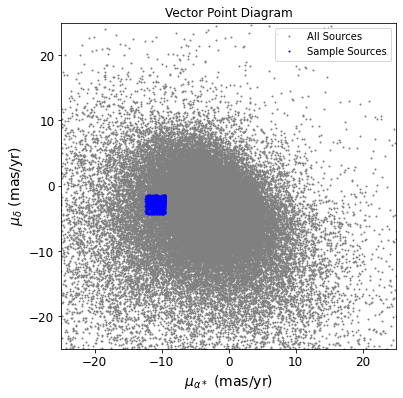

In [30]:
fig = plt.figure(figsize=(6, 6))
plt.plot(allsource['pmra'], allsource['pmdec'], '.', color='gray', markersize=2., label="All Sources")
plt.plot(samplesource['pmra'], samplesource['pmdec'], '.', color='blue', markersize=2., label="Sample Sources")

plt.xlabel(r"$\mu_{\alpha*}$ (mas/yr)")
plt.ylabel(r"$\mu_{\delta}$ (mas/yr)")
plt.title("Vector Point Diagram")

plt.xticks()
plt.yticks()

plt.xlim(-25,25)
plt.ylim(-25,25)

plt.legend()
plt.show()

Parallax Distribution

In [31]:
bins_all = np.arange(allsource['parallax'].min(), allsource['parallax'].max(), .01)
bins_sam = np.arange(samplesource['parallax'].min(), samplesource['parallax'].max(), .01)

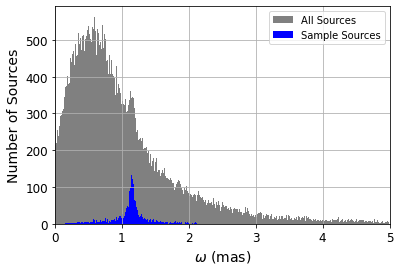

In [32]:
plt.figure(figsize=(6, 4))
allsource['parallax'].hist(bins=bins_all, color='gray', label="All Sources")
samplesource['parallax'].hist(bins=bins_sam, color='b', label="Sample Sources")

plt.xlabel(r"$\omega$ (mas)")
plt.ylabel("Number of Sources")

plt.xlim([0, 5])

plt.xticks()
plt.yticks()

plt.legend()
plt.show()

Color Magnitude Diagram

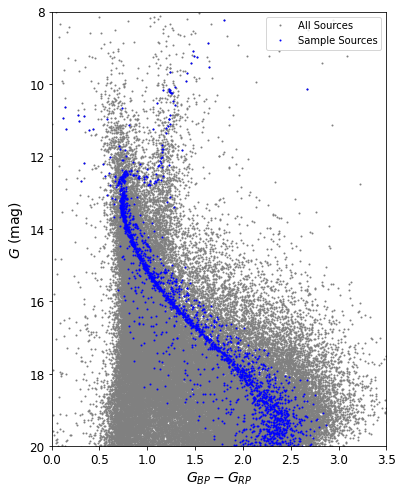

In [33]:
plt.figure(figsize=(6, 8))
plt.plot(allsource['bp_rp'], allsource['phot_g_mean_mag'], '.', color='gray', markersize=2., label="All Sources")
plt.plot(samplesource['bp_rp'], samplesource['phot_g_mean_mag'], '.', color='b', markersize=2., label="Sample Sources")

plt.xlabel(r"$G_{BP}-G_{RP}$")
plt.ylabel(r"$G$ (mag)")

plt.xlim([0., 3.5])
plt.ylim(8,20)

plt.gca().invert_yaxis()
plt.legend()
plt.show()

In [34]:
print('All Sources = %d \nSample Sources = %d' %(len(allsource), len(samplesource)))

All Sources = 70365 
Sample Sources = 2484


Normalize the data

In [35]:
df = samplesource[["pmra", "pmdec", "parallax"]]
df = df.to_numpy().astype("float32", copy = False)

In [36]:
stscaler_df = StandardScaler().fit(df)
df_ = stscaler_df.transform(df)

In [37]:
norm_pmra = df_[:,0]
norm_pmde = df_[:,1]
norm_para = df_[:,2]

Select some parameters to be calculated

In [38]:
sample_data_dict = {
    'norm_pmra' : norm_pmra,
    'norm_pmde' : norm_pmde,
    'norm_para' : norm_para,
}

sample_data = pd.DataFrame(sample_data_dict)

Train Gaussian Mixture Model (GMM) with whole data with two gaussian components (field and cluster)

In [39]:
gmm = GaussianMixture(n_components=2, max_iter=1000, covariance_type='full', random_state=None).fit(sample_data)

Calculate means, covariances and weights of trained/fitted models

In [40]:
gmm.means_, gmm.covariances_, gmm.weights_

(array([[-0.09165151, -0.04972112,  0.08055847],
        [ 0.09581939,  0.0519822 , -0.08422189]]),
 array([[[ 0.14029073,  0.01259668,  0.00416746],
         [ 0.01259668,  0.14048302, -0.00863271],
         [ 0.00416746, -0.00863271,  0.05359695]],
 
        [[ 1.88084336, -0.0233493 , -0.07495229],
         [-0.0233493 ,  1.89331891, -0.04631564],
         [-0.07495229, -0.04631564,  1.97556478]]]),
 array([0.51111603, 0.48888397]))

Calculate the probabilities of the whole data

In [41]:
pred_data = gmm.predict_proba(sample_data)
pred_data

array([[3.52058368e-04, 9.99647942e-01],
       [4.58826122e-26, 1.00000000e+00],
       [8.78725913e-01, 1.21274087e-01],
       ...,
       [7.03448944e-39, 1.00000000e+00],
       [1.25523916e-11, 1.00000000e+00],
       [9.52188897e-10, 9.99999999e-01]])

Check the calculated probabilities

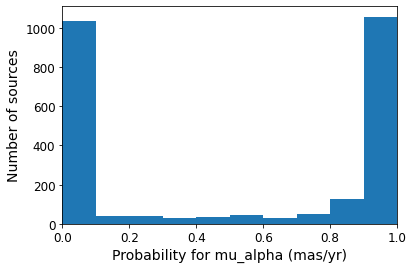

In [42]:
plt.hist(pred_data[:,0], bins=[0., .1, .2, .3, .4, .5, .6, .7, .8, .9, 1.])
plt.xlim([0., 1.])
plt.xlabel("Probability for mu_alpha (mas/yr)")
plt.ylabel("Number of sources")
plt.show()

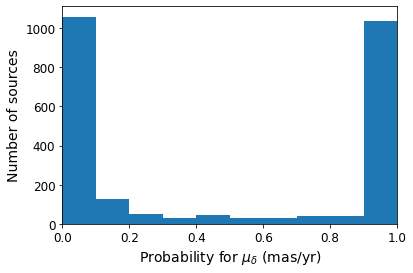

In [43]:
plt.hist(pred_data[:,1], bins=[0., .1, .2, .3, .4, .5, .6, .7, .8, .9, 1.])
plt.xlim([0., 1.])
plt.xlabel("Probability for $\mu_{\delta}$ (mas/yr)")
plt.ylabel("Number of sources")
plt.show()

---

####The Probabilities

In [44]:
samplesource['prob'] = pred_data[:,0]

Determine the probability member classes. According to Agarwal et al. (2021), there are three main classes: `member_high` is high probability members ($P(x) \ge 0.6$); `member_moder` is moderate probability members ($0.2 \lt P(x) \lt 0.6$); and `member_low` is low probability members ($P(x) \le 0.2$). There is also one additional class: `member_ultra` is ultra-high probability members ($P(x) \ge 0.8$).  

In [45]:
member_ultra = samplesource[samplesource['prob'] >= .8].reset_index(drop=True)
member_high  = samplesource[samplesource['prob'] >= .6].reset_index(drop=True)
member_moder = samplesource[(samplesource['prob'] > .2) & (samplesource['prob'] < .6)].reset_index(drop=True)
member_low   = samplesource[samplesource['prob'] <= .2].reset_index(drop=True)
print (len(member_ultra),len(member_high),len(member_moder),len(member_low))
print (max(member_ultra['parallax']),min(member_ultra['parallax']))

1186 1267 144 1073
1.3111384052662989 0.9830071070069112


Stars with a high probability values are automatically considered as members of the cluster. Stars with medium probability values ​​can be considered as the cluster members(member_incl) if their parallax values lie in the parallax value range of ultra-high probability cluster members.

In [46]:
member_incl = member_moder[(member_moder['parallax'] >= member_ultra['parallax'].min()) & 
                           (member_moder['parallax'] <= member_ultra['parallax'].max())].reset_index(drop=True)

In [47]:
print('Sample Sources = %d \nHigh probability member sources (p >= 0.6) = %d \nModerate probability member sources (0.2 <= p < 0.6) = %d \nIncluded moderate probability member sources = %d' %(len(samplesource),
                                                                                                                                          len(samplesource[samplesource['prob'] >= .6]),
                                                                                                                                          len(samplesource[(samplesource['prob'] >= .2) & (samplesource['prob'] < .6)]),
                                                                                                                                          len(member_incl)))

Sample Sources = 2484 
High probability member sources (p >= 0.6) = 1267 
Moderate probability member sources (0.2 <= p < 0.6) = 144 
Included moderate probability member sources = 89


Combine `member_high` and `member_incl` to get all members. 

In [48]:
member_all = pd.concat([member_high, member_incl]).sort_values(by=['prob'], ascending=False).reset_index(drop=True)

In [49]:
len(member_all)

1356

Calculate some important parameters

In [50]:
mean_para_val = np.mean(member_all['parallax'])
mean_para_std = np.std(member_all['parallax'])

member_dist = 1000./(member_all['parallax'])

In [51]:
mean_pmra_val = np.mean(member_all['pmra'])
mean_pmra_std = np.std(member_all['pmra'])
mean_pmde_val = np.mean(member_all['pmdec'])
mean_pmde_std = np.std(member_all['pmdec'])
mean_dist_val = np.mean(member_dist )
mean_dist_std = np.std(member_dist )

In [52]:
mean_pmra_val, mean_pmra_std, mean_pmde_val, mean_pmde_std, mean_para_val, mean_para_std, mean_dist_val, mean_dist_std

(-10.965562294052933,
 0.2070911437924328,
 -2.904551992243289,
 0.19546919873592733,
 1.1495777045410895,
 0.06495005939112077,
 872.7128766606594,
 50.2555301607383)

---

####Visualization II (Result)

Probability Distribution

In [53]:
bins_samp = np.arange(samplesource['prob'].min(), samplesource['prob'].max(), .1)
bins_high = np.arange(samplesource['prob'][samplesource['prob'] >= .6].min(), samplesource['prob'][samplesource['prob'] >= .6].max(), .1)
bins_mode = np.arange(samplesource['prob'][(samplesource['prob'] >= .2) & (samplesource['prob'] < .6) & 
                                       (samplesource['parallax'] >= member_ultra['parallax'].min()) & 
                                       (samplesource['parallax'] <= member_ultra['parallax'].max())].min(), 
                      samplesource['prob'][(samplesource['prob'] >= .2) & (samplesource['prob'] < .6) & 
                                       (samplesource['parallax'] >= member_ultra['parallax'].min()) & 
                                       (samplesource['parallax'] <= member_ultra['parallax'].max())].max(), .1)

bins = np.linspace(0., 1., 10)

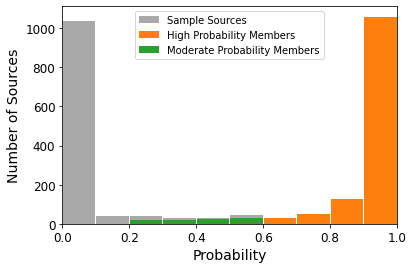

In [54]:
plt.figure(figsize=(6, 4))
plt.hist(samplesource['prob'], bins=[0., .1, .2, .3, .4, .5, .6, .7, .8, .9, 1.], color='darkgray', rwidth=.975, label="Sample Sources")
plt.hist(member_high['prob'], bins=[.6, .7, .8, .9, 1.], color='tab:orange', rwidth=.975, label="High Probability Members")
plt.hist(member_incl['prob'], bins=[.2, .3, .4, .5, .6], color='tab:green', rwidth=.975, label="Moderate Probability Members")

plt.xlabel("Probability")
plt.ylabel("Number of Sources")

plt.xlim([0., 1.])

plt.xticks()
plt.yticks()

plt.legend()
plt.show()

Vector Point Diagram

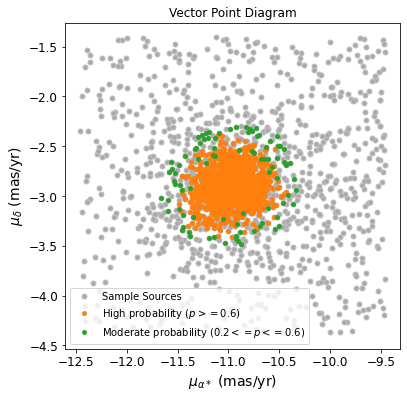

In [55]:
fig = plt.figure(figsize=(6, 6))
plt.plot(samplesource['pmra'], samplesource['pmdec'], 'o', mec='silver', mfc='darkgray', markersize=5., label="Sample Sources")
plt.plot(member_high['pmra'], member_high['pmdec'], 'o', mfc='tab:orange', mec='None', markersize=5., label=r"High probability ($p >= 0.6$)")
plt.plot(member_incl['pmra'], member_incl['pmdec'], 'o', mfc='tab:green', mec='None', markersize=5., label=r"Moderate probability ($0.2 <= p <= 0.6$)")

plt.xlabel(r"$\mu_{\alpha*}$ (mas/yr)")
plt.ylabel(r"$\mu_{\delta}$ (mas/yr)")

plt.xticks()
plt.yticks()
plt.title("Vector Point Diagram")
plt.legend()
plt.show()

Parallax and proper motions distribution

In [56]:
bins_samp = np.arange(samplesource['parallax'].min(), samplesource['parallax'].max(), .05)
bins_high = np.arange(member_high['parallax'].min(), member_high['parallax'].max(), .05)
bins_mode = np.arange(member_incl['parallax'].min(), member_incl['parallax'].max(), .05)

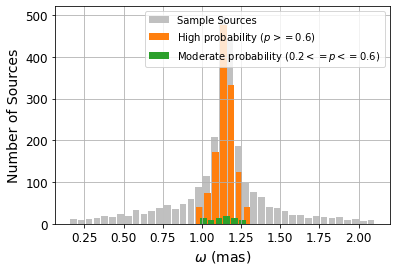

In [57]:
plt.figure()#figsize=(6, 4))
samplesource['parallax'].hist(bins=bins_samp, color='silver', rwidth=.85, label="Sample Sources")
member_high['parallax'].hist(bins=bins_high, color='tab:orange', rwidth=.85, label=r"High probability ($p >= 0.6$)")
member_incl['parallax'].hist(bins=bins_mode, color='tab:green', rwidth=.85, label=r"Moderate probability ($0.2 <= p <= 0.6$)")

plt.xlabel(r"$\omega$ (mas)")
plt.ylabel("Number of Sources")

plt.xticks()
plt.yticks()

plt.legend()
plt.show()

Spatial distribution

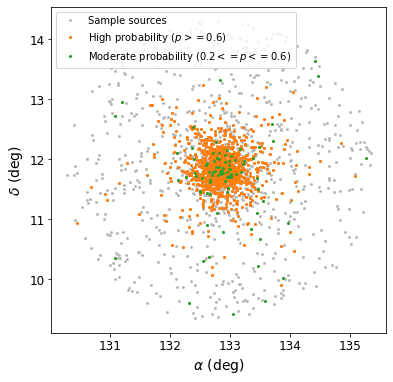

In [58]:
fig = plt.figure(figsize=(6, 6))
plt.plot(samplesource['ra'], samplesource['dec'], 'o', mec='silver', mfc='darkgray', markersize=2., label="Sample sources")
plt.plot(member_high['ra'], member_high['dec'], 'o', mfc='tab:orange', markersize=2., label=r"High probability ($p >= 0.6$)")
plt.plot(member_incl['ra'], member_incl['dec'], 'o', mfc='tab:green', markersize=2., label=r"Moderate probability ($0.2 <= p <= 0.6$)")

plt.xlabel(r'$\alpha$ (deg)')
plt.ylabel(r'$\delta$ (deg)')

plt.legend()
#ax.set_xticklabels([358.25, 358.5, 358.75, 359.0, 359.25, 359.5, 359.75, 0.00, 0.25], fontsize=18.)
plt.show()

Color Magnitude Diagram

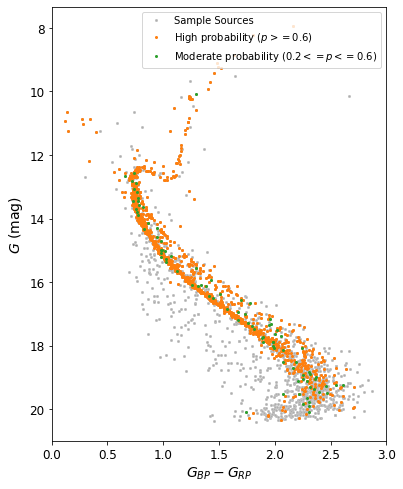

In [60]:
plt.figure(figsize=(6, 8))
plt.plot(samplesource['bp_rp'], samplesource['phot_g_mean_mag'], 'o', mec='silver', mfc='darkgray', markersize=2., label="Sample Sources")
plt.plot(member_high['bp_rp'], member_high['phot_g_mean_mag'], 'o', color='tab:orange', markersize=2., label=r"High probability ($p >= 0.6$)")
plt.plot(member_incl['bp_rp'], member_incl['phot_g_mean_mag'], 'o', color='tab:green', markersize=2., label=r"Moderate probability ($0.2 <= p <= 0.6$)")

plt.xlabel(r"$G_{BP}-G_{RP}$")
plt.ylabel(r"$G$ (mag)")

plt.xlim([0., 3.])

plt.gca().invert_yaxis()
plt.legend()
plt.show()

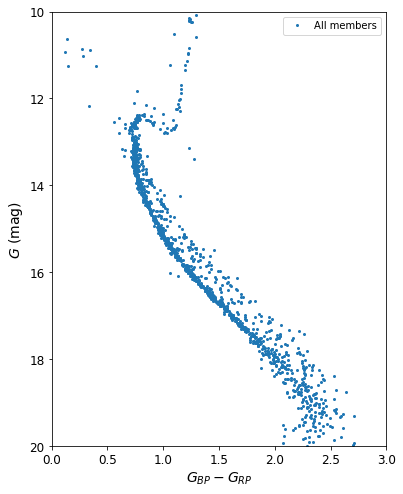

In [61]:
plt.figure(figsize=(6, 8))
plt.plot(member_all['bp_rp'], member_all['phot_g_mean_mag'], 'o', color='tab:blue', markersize=2., label=r"All members")

plt.xlabel(r"$G_{BP}-G_{RP}$")
plt.ylabel(r"$G$ (mag)")

plt.xlim([0., 3.])
plt.ylim([10,20])

plt.gca().invert_yaxis()
plt.legend()
plt.show()

In [62]:
!pip install openpyxl

member_all['e_bp_rp'] = member_all['e_BPmag'] + member_all['e_RPmag']

member_all.to_excel("output.xlsx")

#for exporting sources to Asteca


In [93]:
#@title Code from https://github.com/jieunchoi/MIST_codes/blob/master/scripts/read_mist_models.py
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt

class ISO:
    
    """
    
    Reads in MIST isochrone files.
    
    """
    
    def __init__(self, filename, verbose=True):
    
        """
        
        Args:
            filename: the name of .iso file.
        
        Usage:
            >> iso = read_mist_models.ISO('MIST_v1.0_feh_p0.00_afe_p0.0_vvcrit0.4.iso')
            >> age_ind = iso.age_index(8.0)
            >> logTeff = iso.isos[age_ind]['log_Teff']
            >> logL = iso.isos[age_ind]['log_L']
            >> plt.plot(logTeff, logL) #plot the HR diagram for logage = 8.0
            
        Attributes:
            version     Dictionary containing the MIST and MESA version numbers.
            abun        Dictionary containing Yinit, Zinit, [Fe/H], and [a/Fe] values.
            rot         Rotation in units of surface v/v_crit.
            ages        List of ages.
            num_ages    Number of isochrones.
            hdr_list    List of column headers.
            isos        Data.
            
        """
        
        self.filename = filename
        if verbose:
            print('Reading in: ' + self.filename)
            
        self.version, self.abun, self.rot, self.ages, self.num_ages, self.hdr_list, self.isos = self.read_iso_file()
        
    def read_iso_file(self):

        """
        Reads in the isochrone file.
        
        Args:
            filename: the name of .iso file.
        
        """
        
        #open file and read it in
        with open(self.filename) as f:
            content = [line.split() for line in f]
        version = {'MIST': content[0][-1], 'MESA': content[1][-1]}
        abun = {content[3][i]:float(content[4][i]) for i in range(1,5)}
        rot = float(content[4][-1])
        num_ages = int(content[6][-1])
        
        #read one block for each isochrone
        iso_set = []
        ages = []
        counter = 0
        data = content[8:]
        for i_age in range(num_ages):
            #grab info for each isochrone
            num_eeps = int(data[counter][-2])
            num_cols = int(data[counter][-1])
            hdr_list = data[counter+2][1:]
            formats = tuple([np.int32]+[np.float64 for i in range(num_cols-1)])
            iso = np.zeros((num_eeps),{'names':tuple(hdr_list),'formats':tuple(formats)})
            #read through EEPs for each isochrone
            for eep in range(num_eeps):
                iso_chunk = data[3+counter+eep]
                iso[eep]=tuple(iso_chunk)
            iso_set.append(iso)
            ages.append(iso[0][1])
            counter+= 3+num_eeps+2
        return version, abun, rot, ages, num_ages, hdr_list, iso_set  
        
    def age_index(self, age):
    
        """
        Returns the index for the user-specified age.
    
        Args:
            age: the age of the isochrone.
    
        """
    
        diff_arr = abs(np.array(self.ages) - age)
        age_index = np.where(diff_arr == min(diff_arr))[0][0]
    
        if ((age > max(self.ages)) | (age < min(self.ages))):
            print('The requested age is outside the range. Try between ' + str(min(self.ages)) + ' and ' + str(max(self.ages)))
        
        return age_index
    		
class ISOCMD:
    
    """
    
    Reads in MIST CMD files.
    
    """
    
    def __init__(self, filename, verbose=True):
    
        """
        
        Args:
            filename: the name of .iso.cmd file.
        
        Usage:
            >> isocmd = read_mist_models.ISOCMD('MIST_v1.0_feh_p0.00_afe_p0.0_vvcrit0.4.iso.cmd')
            >> age_ind = isocmd.age_index(7.0)
            >> B = isocmd.isocmds[age_ind]['Bessell_B']
            >> V = isocmd.isocmds[age_ind]['Bessell_V']
            >> plt.plot(B-V, V) #plot the CMD for logage = 7.0
        
        Attributes:
            version         Dictionary containing the MIST and MESA version numbers.
            photo_sys       Photometric system. 
            abun            Dictionary containing Yinit, Zinit, [Fe/H], and [a/Fe] values.
            Av_extinction   Av for CCM89 extinction.
            rot             Rotation in units of surface v/v_crit.
            ages            List of ages.
            num_ages        Number of ages.
            hdr_list        List of column headers.
            isocmds         Data.
        
        """
        
        self.filename = filename
        if verbose:
            print('Reading in: ' + self.filename)
            
        self.version, self.photo_sys, self.abun, self.Av_extinction, self.rot, self.ages, self.num_ages, self.hdr_list, self.isocmds = self.read_isocmd_file()
    
    def read_isocmd_file(self):

        """
        Reads in the cmd file.
        
        Args:
            filename: the name of .iso.cmd file.
        
        """
        
        #open file and read it in
        with open(self.filename) as f:
            content = [line.split() for line in f]
        version = {'MIST': content[0][-1], 'MESA': content[1][-1]}
        photo_sys = ' '.join(content[2][4:])
        abun = {content[4][i]:float(content[5][i]) for i in range(1,5)}
        rot = float(content[5][-1])
        num_ages = int(content[7][-1])
        Av_extinction = float(content[8][-1])
        
        #read one block for each isochrone
        isocmd_set = []
        ages = []
        counter = 0
        data = content[10:]
        for i_age in range(num_ages):
            #grab info for each isochrone
            num_eeps = int(data[counter][-2])
            num_cols = int(data[counter][-1])
            hdr_list = data[counter+2][1:]
            formats = tuple([np.int32]+[np.float64 for i in range(num_cols-1)])
            isocmd = np.zeros((num_eeps),{'names':tuple(hdr_list),'formats':tuple(formats)})
            #read through EEPs for each isochrone
            for eep in range(num_eeps):
                isocmd_chunk = data[3+counter+eep]
                isocmd[eep]=tuple(isocmd_chunk)
            isocmd_set.append(isocmd)
            ages.append(isocmd[0][1])
            counter+= 3+num_eeps+2
        return version, photo_sys, abun, Av_extinction, rot, ages, num_ages, hdr_list, isocmd_set

    def age_index(self, age):
        
        """
        Returns the index for the user-specified age.
        
        Args:
            age: the age of the isochrone.
        
        """
        
        diff_arr = abs(np.array(self.ages) - age)
        age_index = np.where(diff_arr == min(diff_arr))[0][0]
        
        if ((age > max(self.ages)) | (age < min(self.ages))):
            print('The requested age is outside the range. Try between ' + str(min(self.ages)) + ' and ' + str(max(self.ages)))
            
        return age_index

        
class EEP:
    
    """
    
    Reads in and plots MESA EEP files.
    
    """
    
    def __init__(self, filename, verbose=True):
        
        """
        
        Args:
            filename: the name of .track.eep file.
        
        Usage:
            >> eep = read_mist_models.EEP('00200M.track.eep')
            >> logTeff, center_h1, mdot = eep.eeps['log_Teff'], eep['center_h1'], eep['star_mdot']
            
        Attributes:
            version         Dictionary containing the MIST and MESA version numbers.
            abun            Dictionary containing Yinit, Zinit, [Fe/H], and [a/Fe] values.
            rot             Rotation in units of surface v/v_crit.
            minit           Initial mass in solar masses.
            hdr_list        List of column headers.
            eeps            Data.
            
        """
                        
        self.filename = filename
        if verbose:
            print('Reading in: ' + self.filename)
                        
        self.version, self.abun, self.rot, self.minit, self.hdr_list, self.eeps = self.read_eep_file()
        
    def read_eep_file(self):
        
        """
        Reads in the EEP file.
        
        Args:
            filename: the name of .track.eep file.
                
        """
        
        eeps = np.genfromtxt(self.filename, skip_header=11, names=True)
        
        with open(self.filename) as f:
            content = [line.split() for line in f]

        version = {'MIST': content[0][-1], 'MESA': content[1][-1]}
        abun = {content[3][i]:float(content[4][i]) for i in range(1,5)}
        rot = float(content[4][-1])
        minit = float(content[7][1])
        hdr_list = content[11][1:]
        
        return version, abun, rot, minit, hdr_list, eeps
        		
    def plot_HR(self, fignum=0, phases=[], phasecolor=[], **kwargs):
        
        """
        Plots the HR diagram.
        Args:
            None.
            
        Keywords:
            accepts matplotlib keywords: color, linestyle, linewidth, etc.
            keyword: fignum, phase*, phasecolor
            
            * Following the FSPS notation,
            * PMS:-1 ; MS:0 ; SGB+RGB:2 ; CHeB:3 ; EAGB:4 ; TPAGB:5 ; post-AGB:6 ; WR:9
    
        Usage:
            >> eep.plot_HR(fignum=3)
            >> eep.plot_HR(phase=[0, 2], phasecolor=['Gray', 'Blue']) #highlight the MS and RGB phases in gray and blue.
        
        """
        
        x = self.eeps['log_Teff']
        y = self.eeps['log_L']
        
        fig = plt.figure(fignum)
        plt.xlabel('log(Teff) [K]', fontsize=22)
        plt.ylabel('log(L/Lsun)', fontsize=22)
        
        ax = fig.add_subplot(111)
        ax.plot(x, y, **kwargs)
        ax.axis([max(x)+0.2, min(x)-0.2, min(y)-0.2, max(y)+0.2])

        if len(phases) >= 0:
            if len(phases) != len(phasecolor):
                print('The length of the phase and phasecolor array must be identical.')
                return
            for i_p, phase in enumerate(phases):
                p = self.eeps['phase']
                p_ind = np.where(p == phase)
                if len(p_ind) > 0:
                    if phasecolor == '':
                        ax.plot(x[p_ind], y[p_ind], linewidth=4.0, alpha=0.5)
                    else:
                        ax.plot(x[p_ind], y[p_ind], color=phasecolor[i_p], linewidth=4.0, alpha=0.5)

class EEPCMD:
    
    """
    
    Reads in and plots MESA EEP CMD files.
    
    """
    
    def __init__(self, filename, verbose=True):
        
        """
        
        Args:
            filename: the name of .track.eep.cmd file.
        
        Usage:
            >> eepcmd = read_mist_models.EEPCMD('00200M.track.eep.cmd')
            >> B, V, mdot = eepcmd.eepcmds['Bessell_B'], eep['Bessell_V'], eep['star_mdot']
            
        Attributes:
            version         Dictionary containing the MIST and MESA version numbers.
            photo_sys       Photometric system.
            abun            Dictionary containing Yinit, Zinit, [Fe/H], and [a/Fe] values.
            rot             Rotation in units of surface v/v_crit.
            minit           Initial mass in solar masses.
            hdr_list        List of column headers.
            Av_extinction   Av for CCM89 extinction.
            eepcmds         Data.
            
        """
                        
        self.filename = filename
        if verbose:
            print('Reading in: ' + self.filename)
                        
        self.version, self.photo_sys, self.abun, self.rot, self.minit, self.Av_extinction, self.hdr_list, self.eepcmds = self.read_eepcmd_file()
        
    def read_eepcmd_file(self):
        
        """
        Reads in the EEP CMD file.
        
        Args:
            filename: the name of .eep.cmd file.
                
        """
        
        eepcmds = np.genfromtxt(self.filename, skip_header=14, names=True)
        
        with open(self.filename) as f:
            content = [line.split() for line in f]

        version = {'MIST': content[0][-1], 'MESA': content[1][-1]}
        photo_sys = ' '.join(content[2][4:])
        abun = {content[4][i]:float(content[5][i]) for i in range(1,5)}
        rot = float(content[5][-1])
        minit = float(content[8][1])
        Av_extinction = float(content[11][-1])
        hdr_list = content[14][1:]
        
        return version, photo_sys, abun, rot, minit, Av_extinction, hdr_list, eepcmds
        		
    def plot_CMD(self, filters, fignum=0, phases=[], phasecolor=[], **kwargs):
        
        """
        Plots the CMD diagram.
        Args:
            filters: a list of three filters, ['filter1', 'filter2', 'filter3']. x-axis: 'filter1'-'filter2', y-axis: 'filter3'
            
        Keywords:
            accepts matplotlib keywords: color, linestyle, linewidth, etc.
            keyword: fignum, phase*, phasecolor
            
            * Following the FSPS notation,
            * PMS:-1 ; MS:0 ; SGB+RGB:2 ; CHeB:3 ; EAGB:4 ; TPAGB:5 ; post-AGB:6 ; WR:9
    
        Usage:
            >> eepcmd.plot_CMD(['Bessell_B', 'Bessell_V', 'Bessell_V'], fignum=3)
        """
        
        try:
            x1 = self.eepcmds[filters[0]]
        except:
            print(filters[0]) + ' does not appear in this file.'
            return
        try:
            x2 = self.eepcmds[filters[1]]
        except:
            print(filters[1]) + ' does not appear in this file.'
            return
        try:
            y = self.eepcmds[filters[2]]
        except:
            print(filters[2]) + ' does not appear in this file.'
            return
        
        fig = plt.figure(fignum)
        plt.xlabel(' '.join(filters[0].split('_')) + '-' + ' '.join(filters[1].split('_')), fontsize=22)
        plt.ylabel(' '.join(filters[2].split('_')), fontsize=22)
        
        ax = fig.add_subplot(111)
        ax.plot(x1-x2, y, **kwargs)
        ax.axis([min(x1-x2)-0.2, max(x1-x2)+0.2, max(y)+0.2, min(y)-0.2])

        if len(phases) >= 0:
            if len(phases) != len(phasecolor):
                print('The length of the phase and phasecolor array must be identical.')
                return
            for i_p, phase in enumerate(phases):
                p = self.eepcmds['phase']
                p_ind = np.where(p == phase)
                if len(p_ind) > 0:
                    if phasecolor == '':
                        ax.plot(x1[p_ind]-x2[p_ind], y[p_ind], linewidth=4.0, alpha=0.5)
                    else:
                        ax.plot(x1[p_ind]-x2[p_ind], y[p_ind], color=phasecolor[i_p], linewidth=4.0, alpha=0.5)

In [102]:
filename = '/Users/esanmoulighosh/Astrostat_IVC/final.cmd'
iso = ISOCMD(filename)
#iso.isocmds[0]

Reading in: /Users/esanmoulighosh/Astrostat_IVC/final.cmd


array([( 193, 9., 0.10104159, 0.10104137, 3.45834528, 5.23010365, -3.00026325, 0.02, 0.066378, 18.811516, 17.54875 , 15.919135, 14.225712, 12.236414, 10.226295,  9.529095,  9.296671, 13.959359, 16.765406, 15.560939, 17.78627 , 16.191626, 13.815912, 16.179611, 12.520849, 13.838965, 16.132267, 16.175018, 12.49461 , 12.351145, 13.857525, 16.157473, 12.492764, -1.),
       ( 194, 9., 0.1046145 , 0.10461427, 3.46086259, 5.22176685, -2.96927404, 0.02, 0.066384, 18.626944, 17.376579, 15.760962, 14.099311, 12.131614, 10.154588,  9.461916,  9.230571, 13.845212, 16.598217, 15.422943, 17.612612, 16.031916, 13.708578, 16.022396, 12.419555, 13.72962 , 15.975158, 16.017876, 12.393533, 12.254469, 13.748273, 16.000237, 12.391438, -1.),
       ( 195, 9., 0.10929926, 0.10929902, 3.46415422, 5.21078581, -2.92862759, 0.02, 0.066395, 18.387558, 17.152981, 15.554834, 13.93408 , 11.995251, 10.060859,  9.373371,  9.143486, 13.696106, 16.380457, 15.242393, 17.387415, 15.823142, 13.56814 , 15.816966, 12.287237,

1359 1347


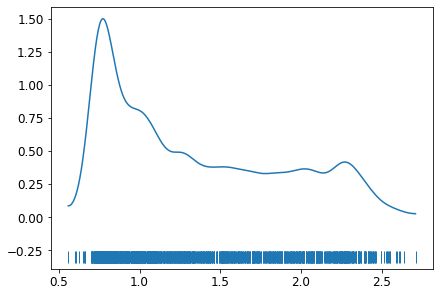

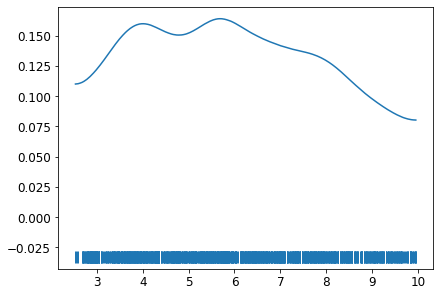

/Users/esanmoulighosh/opt/anaconda3/envs/astrostat/lib/python3.9/site-packages/arviz/plots/backends/matplotlib/kdeplot.py:173: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_x, y_y, density, **pcolormesh_kwargs)


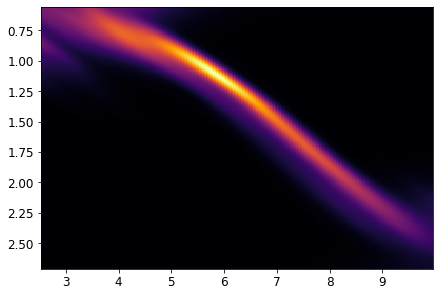

root mean square error for training set  0.09363410652395995
r2 score for training set  0.9704756091515662
root mean square error for training set  0.09325192921356393
r2 score for training set  0.9716365409029286


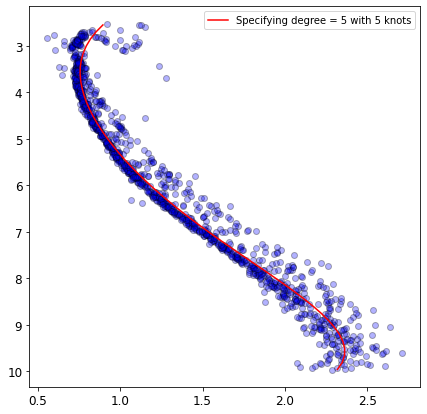

root mean square error for training set  0.09352552051989077
r2 score for training set  0.9705440473907322
root mean square error for training set  0.0932510485805425
r2 score for training set  0.9716370766061779


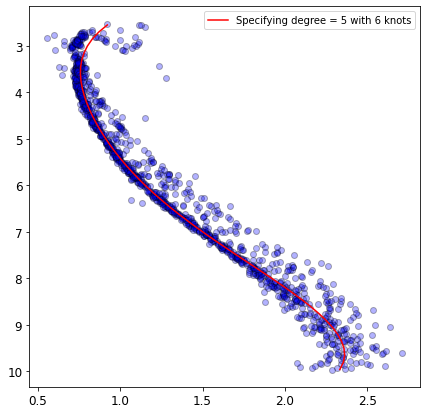

root mean square error for training set  0.09317725969532767
r2 score for training set  0.9707630091196509
root mean square error for training set  0.09398154103717195
r2 score for training set  0.9711909678746772


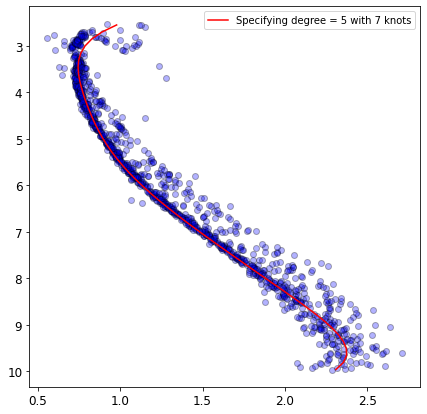

root mean square error for training set  0.09310389137867435
r2 score for training set  0.9708090337460904
root mean square error for training set  0.09456949688221822
r2 score for training set  0.9708293772317192


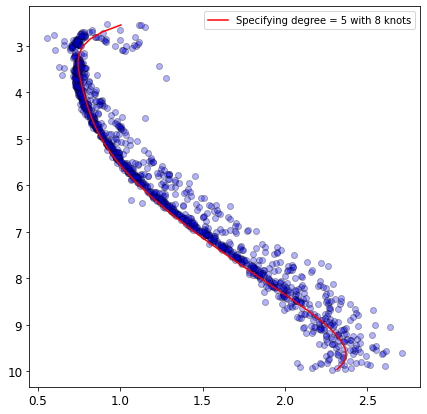

root mean square error for training set  0.09302536173776538
r2 score for training set  0.9708582559494928
root mean square error for training set  0.0954142508647075
r2 score for training set  0.9703059091059547


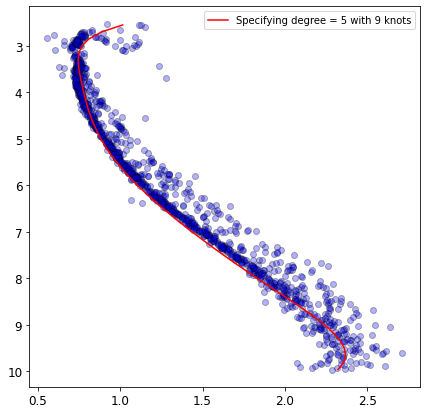

root mean square error for training set  0.09285205633710794
r2 score for training set  0.9709667364130902
root mean square error for training set  0.09464476929260959
r2 score for training set  0.9707829221482185


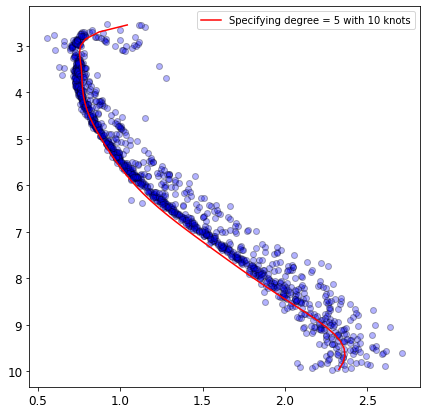

root mean square error for training set  0.09214680127817614
r2 score for training set  0.9714061040468508
root mean square error for training set  0.09540945839381369
r2 score for training set  0.9703088919830639


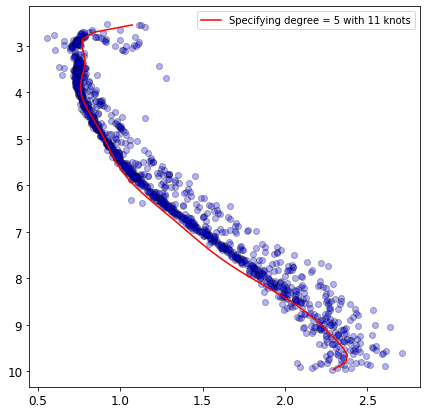

root mean square error for training set  0.09195155028930448
r2 score for training set  0.9715271515808703
root mean square error for training set  0.09753901599088653
r2 score for training set  0.9689686775715441


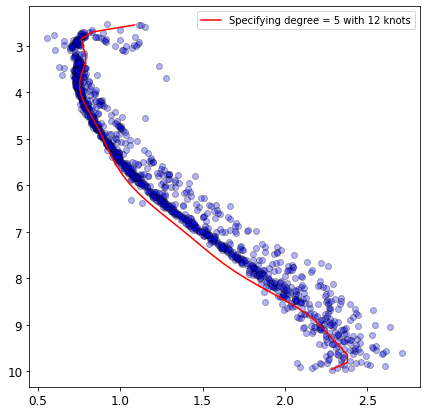

root mean square error for training set  0.09190018638485561
r2 score for training set  0.971558952419314
root mean square error for training set  0.09816776502154308
r2 score for training set  0.9685673243565854


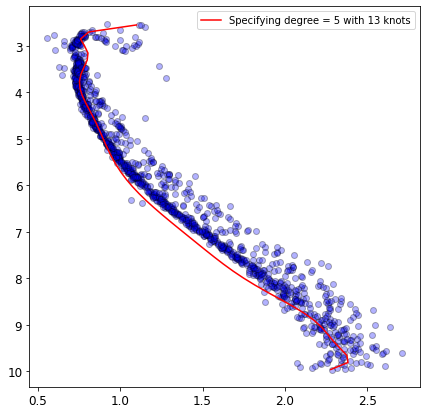

root mean square error for training set  0.09172609869219316
r2 score for training set  0.9716666028376602
root mean square error for training set  0.09878383540925566
r2 score for training set  0.9681715629941127


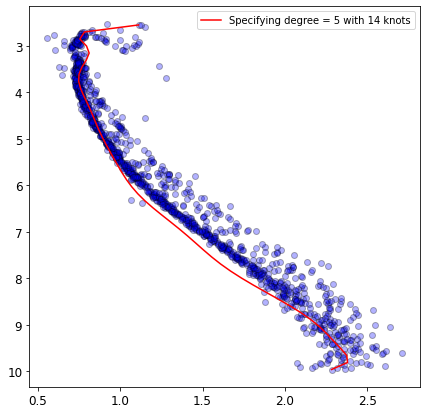

root mean square error for training set  0.09155684360676485
r2 score for training set  0.9717710692256695
root mean square error for training set  0.10069309474816222
r2 score for training set  0.9669293354819091


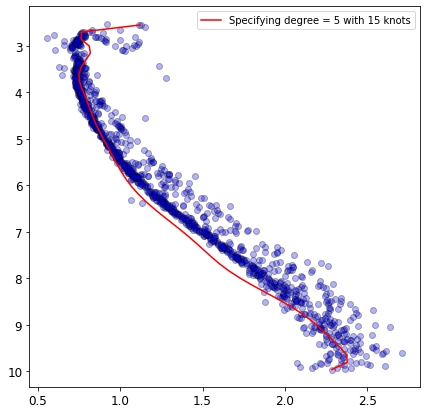

root mean square error for training set  0.09140955055152519
r2 score for training set  0.9718618233570402
root mean square error for training set  0.09822293910660568
r2 score for training set  0.9685319816657844


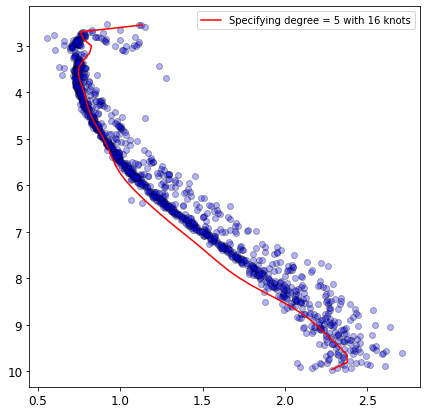

root mean square error for training set  0.09135599911304028
r2 score for training set  0.9718947826800519
root mean square error for training set  0.10095630898361783
r2 score for training set  0.9667562144390083


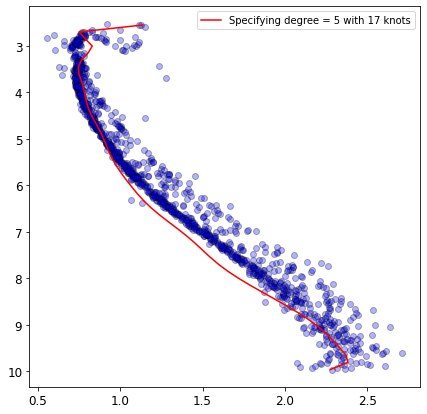

fail
root mean square error for training set  0.09355130956132399
r2 score for training set  0.9705278005842771
root mean square error for training set  0.09323432932322767
r2 score for training set  0.971647246239885


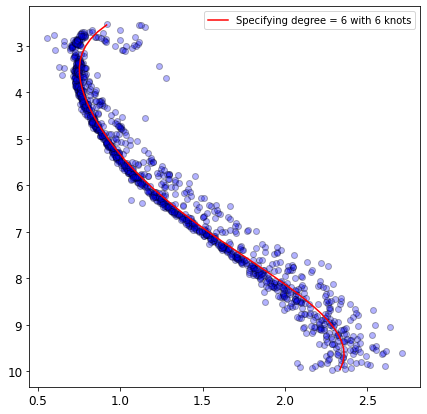

root mean square error for training set  0.09318750650648046
r2 score for training set  0.9707565783145786
root mean square error for training set  0.09324543240000245
r2 score for training set  0.9716404929002374


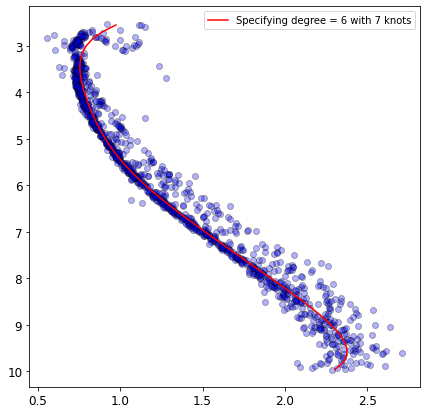

root mean square error for training set  0.09306964255490263
r2 score for training set  0.9708305059393788
root mean square error for training set  0.09385846014664619
r2 score for training set  0.9712663767139641


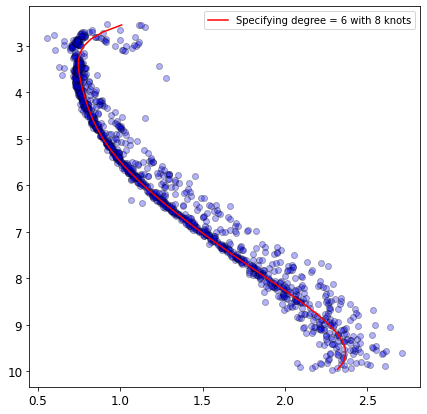

root mean square error for training set  0.09299743327327716
r2 score for training set  0.9708757514362027
root mean square error for training set  0.09419995995273814
r2 score for training set  0.9710569043236248


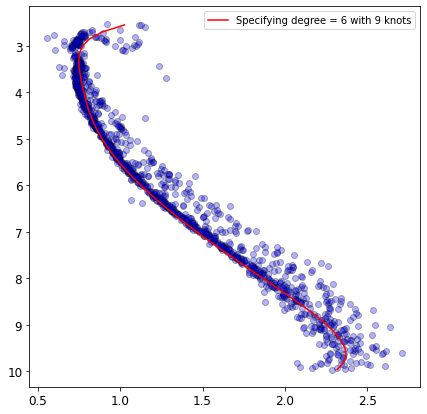

root mean square error for training set  0.0928283347333168
r2 score for training set  0.9709815692046749
root mean square error for training set  0.09482684927847211
r2 score for training set  0.9706703969154377


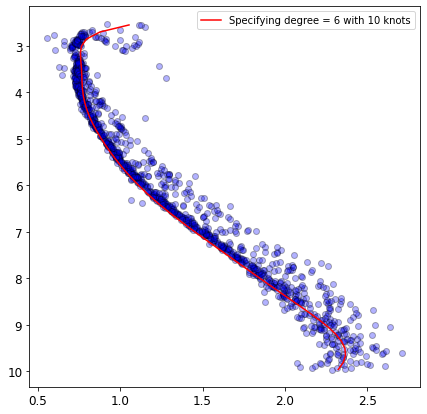

root mean square error for training set  0.09191686963436885
r2 score for training set  0.9715486252985442
root mean square error for training set  0.09501256278335059
r2 score for training set  0.9705554033842381


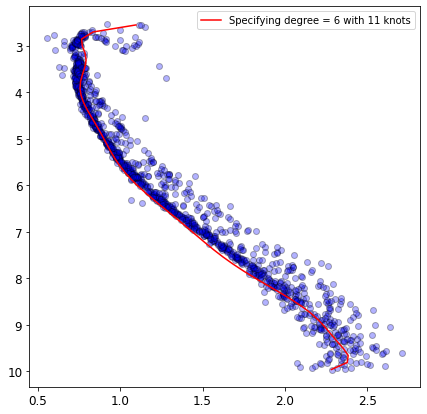

root mean square error for training set  0.0918244537371823
r2 score for training set  0.9716058082185559
root mean square error for training set  0.09532016431912257
r2 score for training set  0.9703644420178034


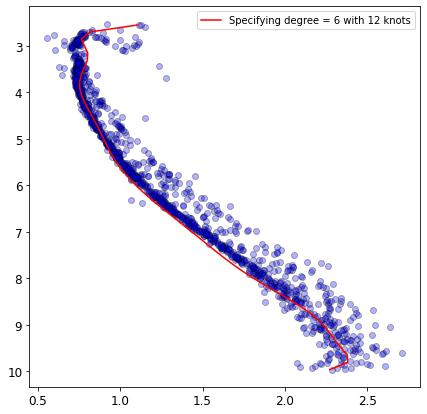

root mean square error for training set  0.09173471275237977
r2 score for training set  0.9716612809706646
root mean square error for training set  0.09673322004950193
r2 score for training set  0.9694792758643486


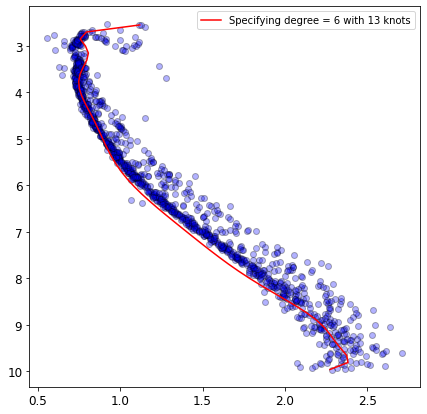

root mean square error for training set  0.09151100751778292
r2 score for training set  0.9717993266414661
root mean square error for training set  0.09815703420129977
r2 score for training set  0.9685741958577712


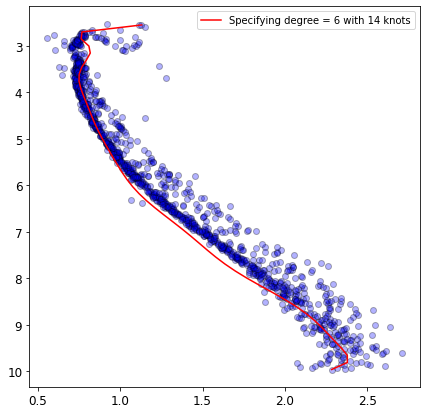

root mean square error for training set  0.09143671782885815
r2 score for training set  0.971845095318431
root mean square error for training set  0.09858487842556546
r2 score for training set  0.9682996429127677


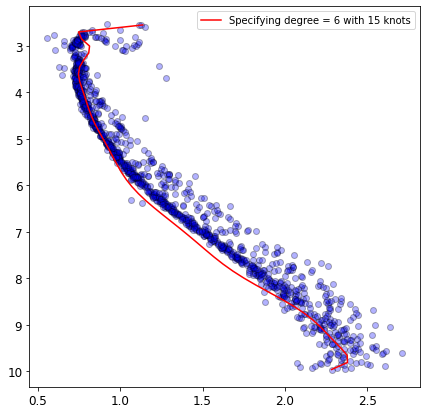

root mean square error for training set  0.09139358007206673
r2 score for training set  0.971871654734899
root mean square error for training set  0.10008263097291784
r2 score for training set  0.9673291095747234


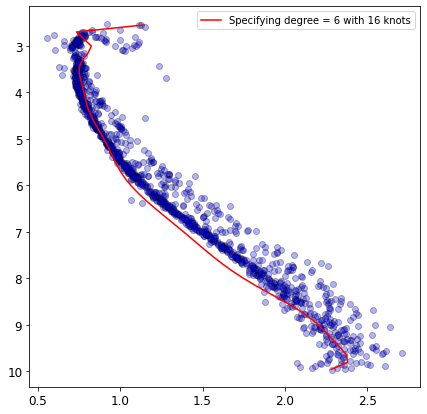

root mean square error for training set  0.09127580161352611
r2 score for training set  0.9719441057424325
root mean square error for training set  0.0980201171991634
r2 score for training set  0.9686618049841104


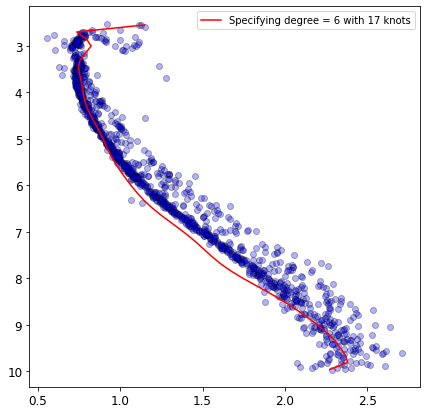

fail
fail
root mean square error for training set  0.09322636036793522
r2 score for training set  0.9707321875616421
root mean square error for training set  0.09308013270580713
r2 score for training set  0.9717409517129605


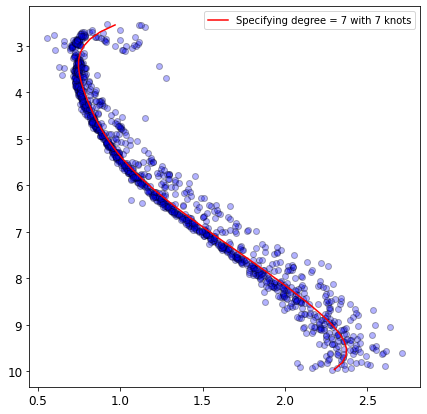

root mean square error for training set  0.09307032692425544
r2 score for training set  0.9708300769535007
root mean square error for training set  0.0934978233136921
r2 score for training set  0.9714867616405405


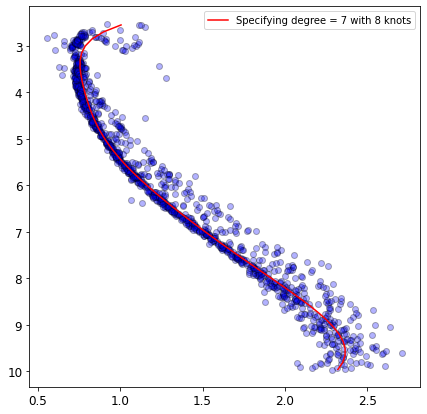

root mean square error for training set  0.09299946572505996
r2 score for training set  0.9708744784058476
root mean square error for training set  0.09357408667644249
r2 score for training set  0.9714402278880633


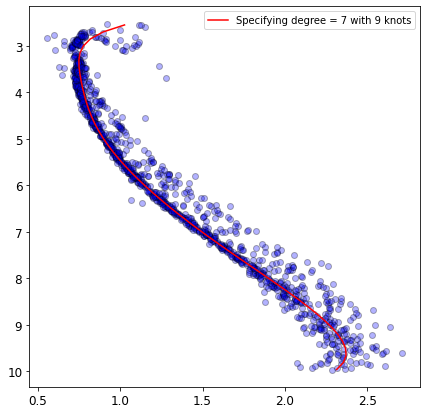

root mean square error for training set  0.09282950918889031
r2 score for training set  0.9709808349229823
root mean square error for training set  0.0939749677071624
r2 score for training set  0.9711949977011888


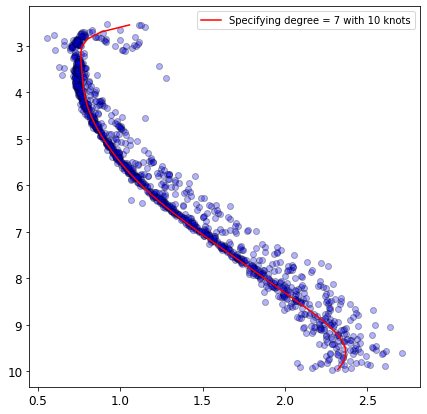

root mean square error for training set  0.09181217304321303
r2 score for training set  0.9716134026457006
root mean square error for training set  0.09516929962021482
r2 score for training set  0.9704581770933867


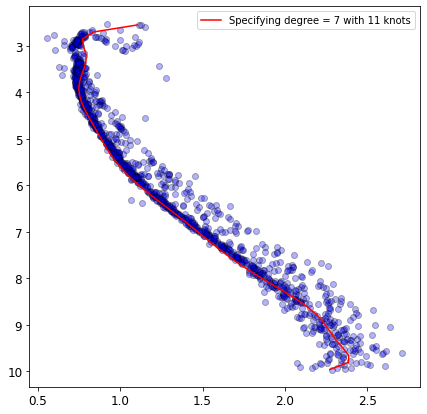

root mean square error for training set  0.09174023975831469
r2 score for training set  0.9716578660586431
root mean square error for training set  0.09483931768250806
r2 score for training set  0.970662683543412


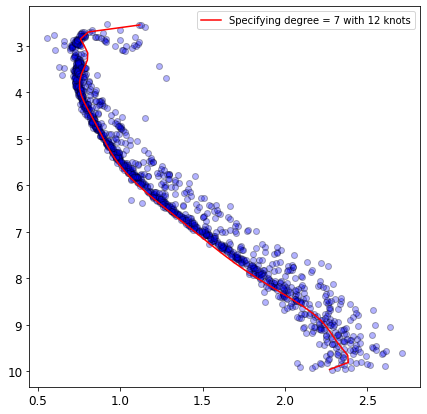

root mean square error for training set  0.09167498149234216
r2 score for training set  0.971698173358684
root mean square error for training set  0.09500779058022953
r2 score for training set  0.9705583611418842


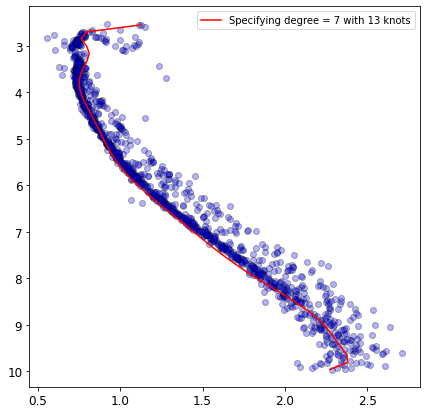

root mean square error for training set  0.0914588465400257
r2 score for training set  0.9718314660640399
root mean square error for training set  0.09704646816959416
r2 score for training set  0.969281287225435


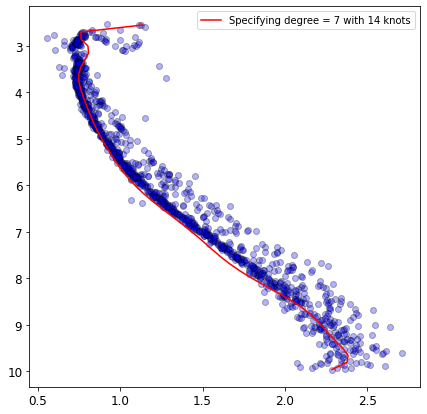

root mean square error for training set  0.09141147768536519
r2 score for training set  0.9718606369032465
root mean square error for training set  0.09751430240699083
r2 score for training set  0.9689844004702804


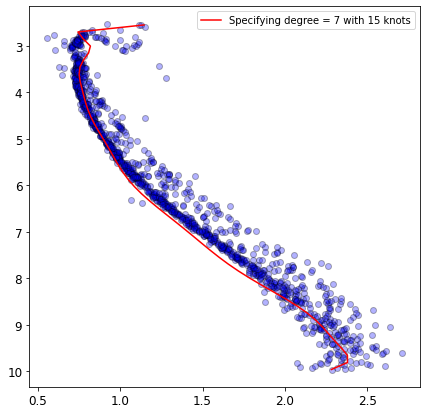

root mean square error for training set  0.09138775396839154
r2 score for training set  0.971875240838697
root mean square error for training set  0.0982594246853678
r2 score for training set  0.968508599304963


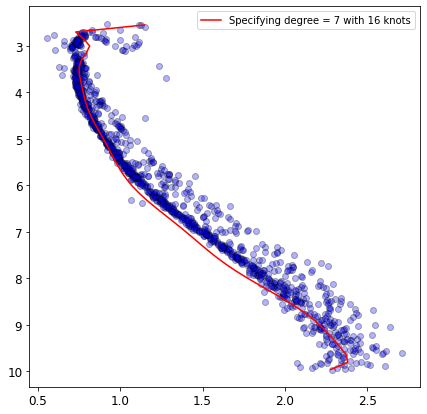

root mean square error for training set  0.09133359167756534
r2 score for training set  0.9719085680606835
root mean square error for training set  0.0996723908139255
r2 score for training set  0.9675963975504368


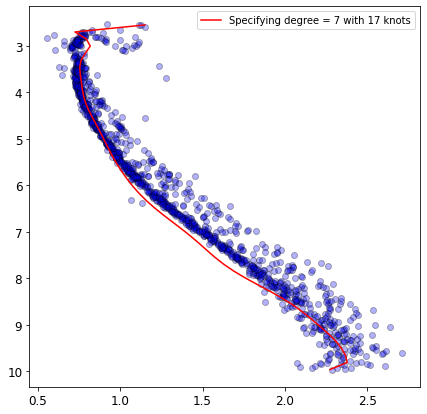

fail
fail
fail
root mean square error for training set  0.0930765676240238
r2 score for training set  0.9708261649260853
root mean square error for training set  0.09354487739020655
r2 score for training set  0.9714580550534263


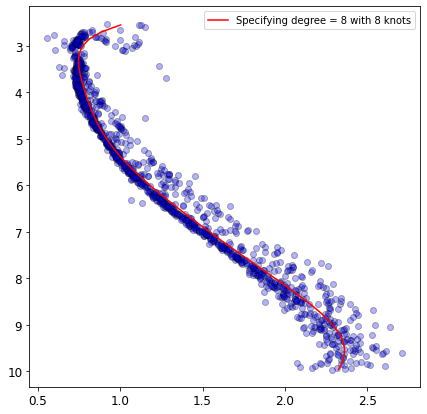

root mean square error for training set  0.09301998660242239
r2 score for training set  0.970861623553553
root mean square error for training set  0.09323754494667724
r2 score for training set  0.9716452904505796


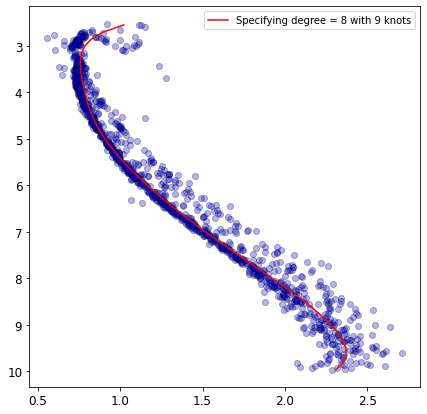

root mean square error for training set  0.09289242220208535
r2 score for training set  0.9709414874829663
root mean square error for training set  0.0934469165814239
r2 score for training set  0.9715178023768197


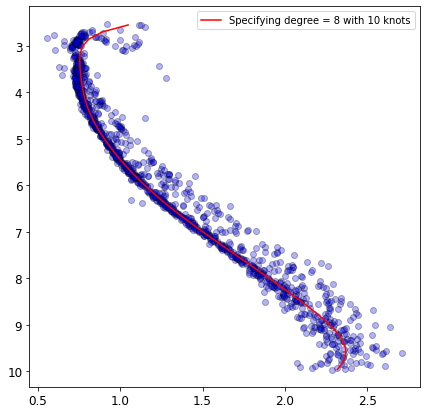

root mean square error for training set  0.09179892888284617
r2 score for training set  0.9716215917456593
root mean square error for training set  0.09500689331350122
r2 score for training set  0.9705589172410856


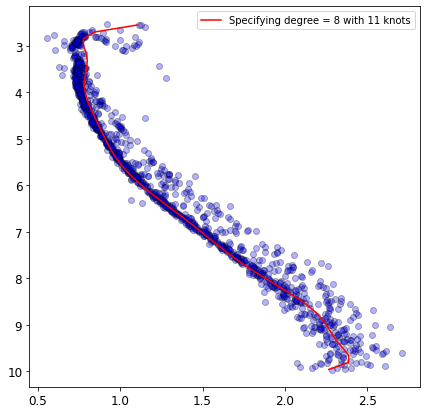

root mean square error for training set  0.09169999068601885
r2 score for training set  0.9716827296160604
root mean square error for training set  0.09484138286674582
r2 score for training set  0.9706614058534273


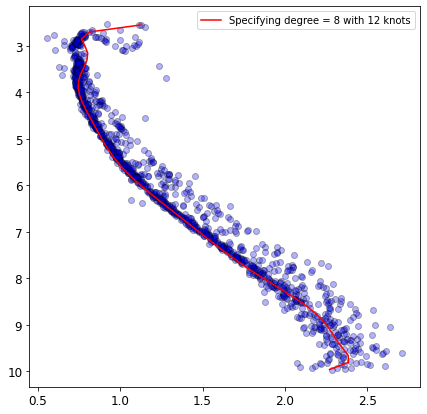

root mean square error for training set  0.09164045078459973
r2 score for training set  0.9717194899280402
root mean square error for training set  0.09463979176862601
r2 score for training set  0.9707859952157035


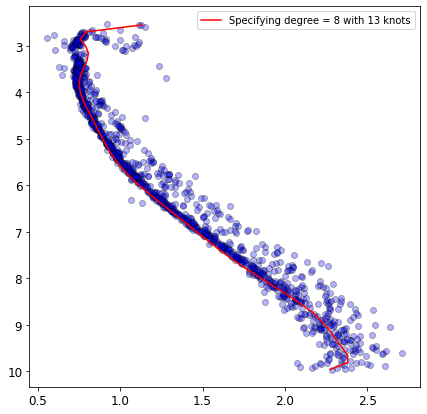

root mean square error for training set  0.09148978646275212
r2 score for training set  0.9718124043830092
root mean square error for training set  0.09543083941436087
r2 score for training set  0.9702955830861737


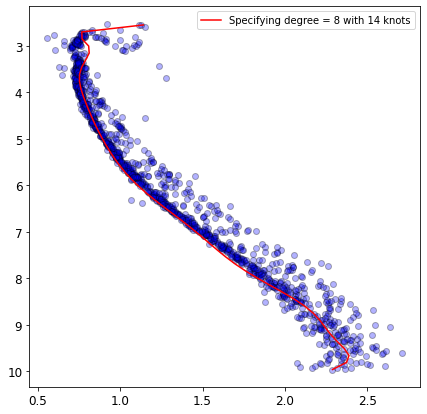

root mean square error for training set  0.09141910598288591
r2 score for training set  0.9718559402416086
root mean square error for training set  0.09678629470278682
r2 score for training set  0.9694457750413654


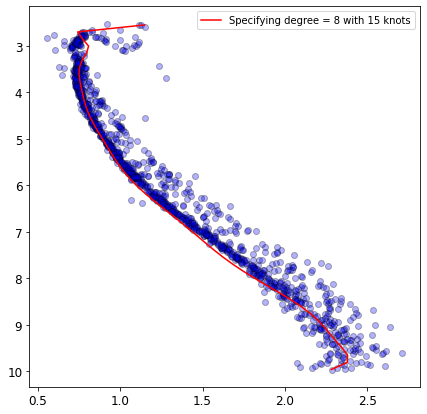

root mean square error for training set  0.0914016713161683
r2 score for training set  0.9718666740046954
root mean square error for training set  0.09735234756187672
r2 score for training set  0.9690873383001187


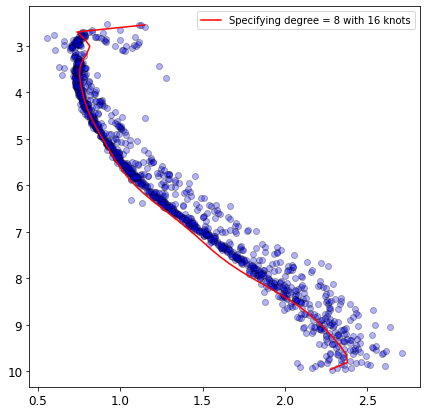

root mean square error for training set  0.09140966421874946
r2 score for training set  0.9718617533776911
root mean square error for training set  0.09788557915691858
r2 score for training set  0.9687477727641006


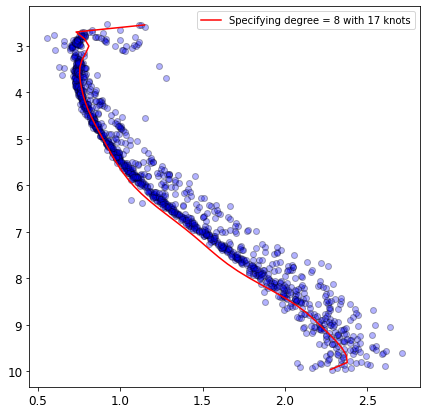

fail
fail
fail
fail
root mean square error for training set  0.09300073501080079
r2 score for training set  0.9708736833719999
root mean square error for training set  0.09318983983499031
r2 score for training set  0.9716742984760564


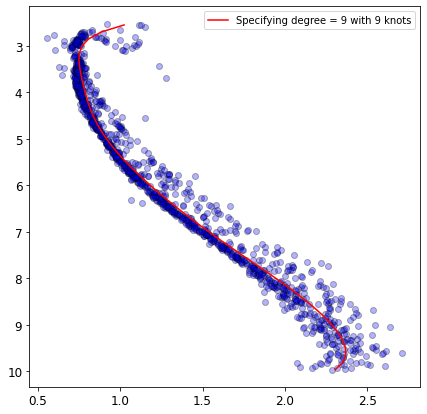

root mean square error for training set  0.09296519624921305
r2 score for training set  0.9708959394422636
root mean square error for training set  0.093220338085436
r2 score for training set  0.9716557551305066


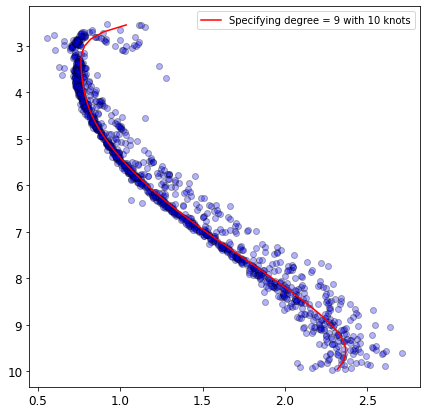

root mean square error for training set  0.09186676579476426
r2 score for training set  0.9715796345048906
root mean square error for training set  0.09435122175257227
r2 score for training set  0.9709638788122242


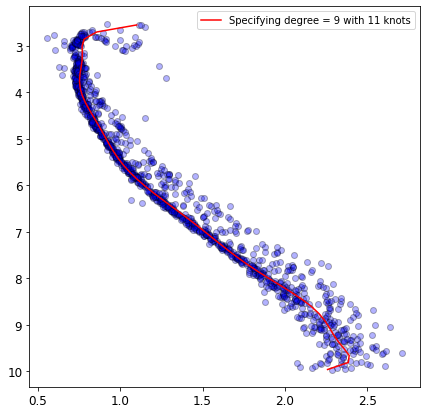

root mean square error for training set  0.09168826310203225
r2 score for training set  0.9716899721888979
root mean square error for training set  0.0947856205207928
r2 score for training set  0.9706958951838073


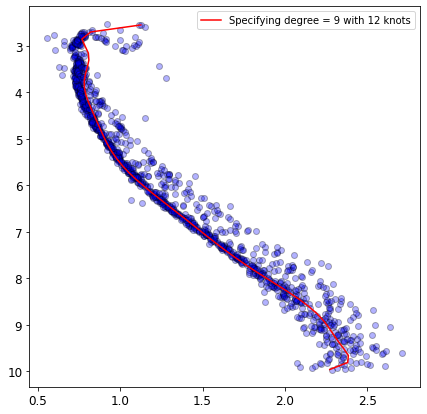

root mean square error for training set  0.09162568659401786
r2 score for training set  0.9717286017384262
root mean square error for training set  0.09471838393145428
r2 score for training set  0.970737454425122


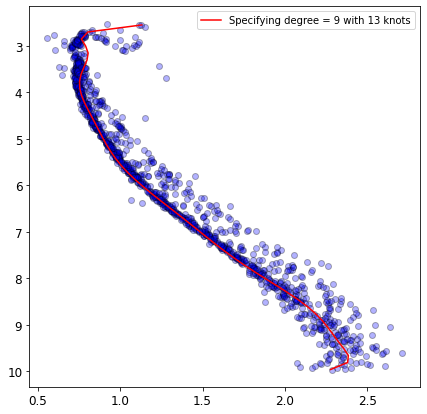

root mean square error for training set  0.09150239865630788
r2 score for training set  0.9718046323260502
root mean square error for training set  0.09496275391734411
r2 score for training set  0.9705862670406389


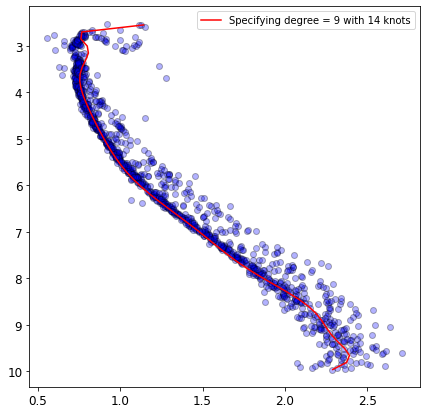

root mean square error for training set  0.09142554286559304
r2 score for training set  0.9718519768165145
root mean square error for training set  0.09531823972142191
r2 score for training set  0.9703656387415259


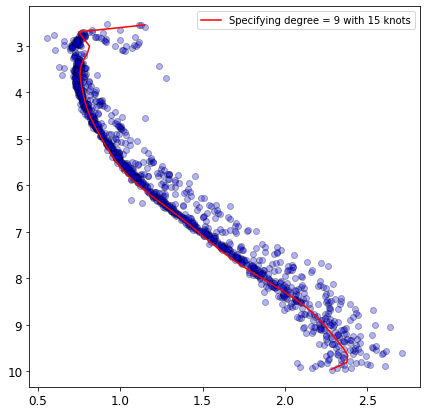

root mean square error for training set  0.0914312009156556
r2 score for training set  0.9718484927168309
root mean square error for training set  0.09659851220024658
r2 score for training set  0.969564221210104


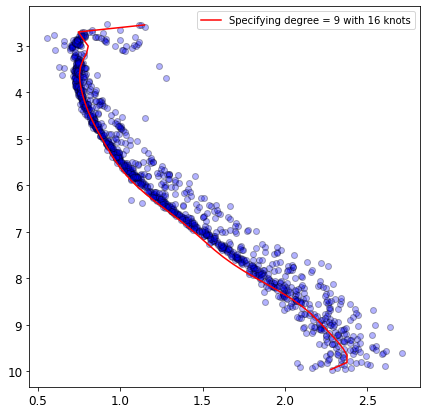

root mean square error for training set  0.09143158932166283
r2 score for training set  0.9718482535372586
root mean square error for training set  0.09673415656350158
r2 score for training set  0.9694786848941777


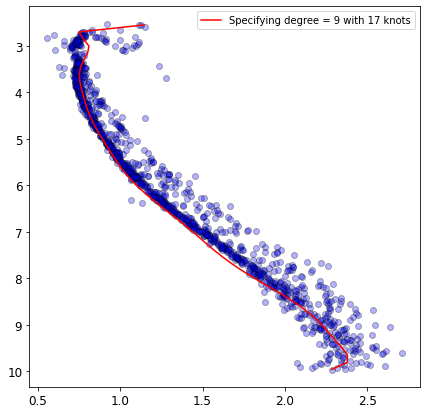

fail
fail
fail
fail
fail
root mean square error for training set  0.09299243040435895
r2 score for training set  0.9708788848749144
root mean square error for training set  0.09319156633476598
r2 score for training set  0.9716732489030464


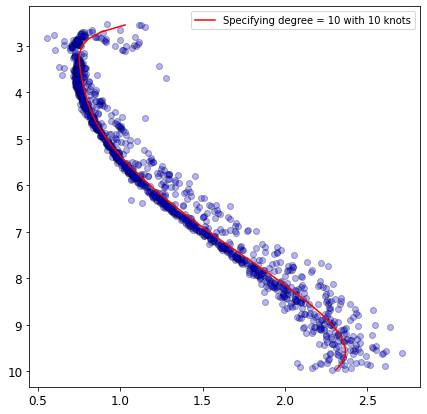

root mean square error for training set  0.09196274197414124
r2 score for training set  0.9715202201362702
root mean square error for training set  0.09414251457019482
r2 score for training set  0.9710921939403718


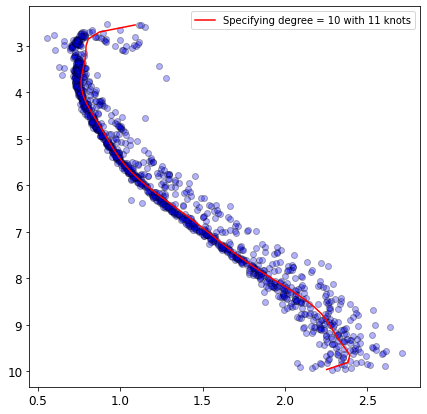

root mean square error for training set  0.09169640589603885
r2 score for training set  0.971684943563569
root mean square error for training set  0.09406118405979524
r2 score for training set  0.971142119759123


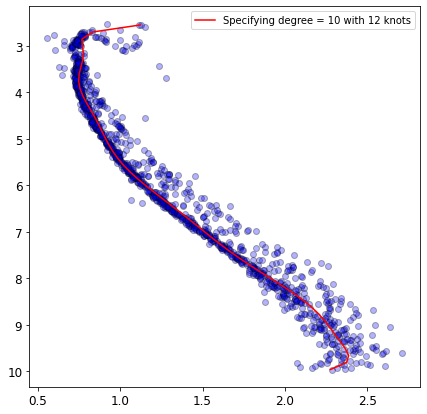

root mean square error for training set  0.09163376146976865
r2 score for training set  0.9717236184614405
root mean square error for training set  0.09460874584173241
r2 score for training set  0.9708051589749699


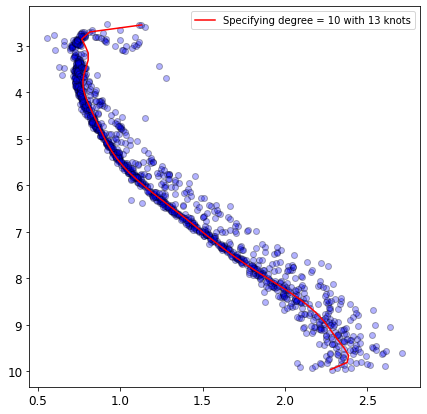

root mean square error for training set  0.09152055348081098
r2 score for training set  0.9717934428328736
root mean square error for training set  0.09482720253310621
r2 score for training set  0.9706701783942576


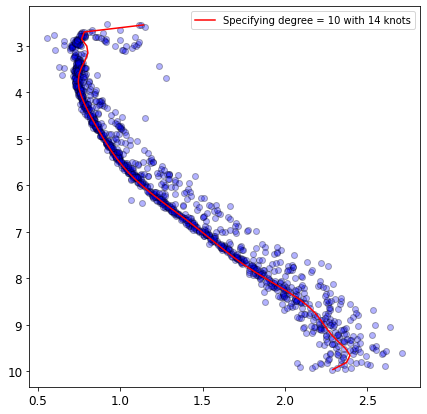

root mean square error for training set  0.0914366909116035
r2 score for training set  0.9718451118949801
root mean square error for training set  0.09518190949578648
r2 score for training set  0.9704503480268336


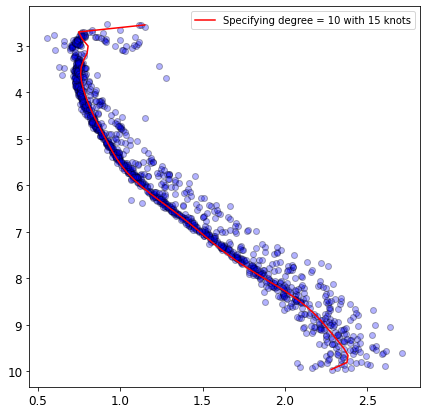

root mean square error for training set  0.09145482015676337
r2 score for training set  0.9718339461919075
root mean square error for training set  0.095070336528019
r2 score for training set  0.9705195840830122


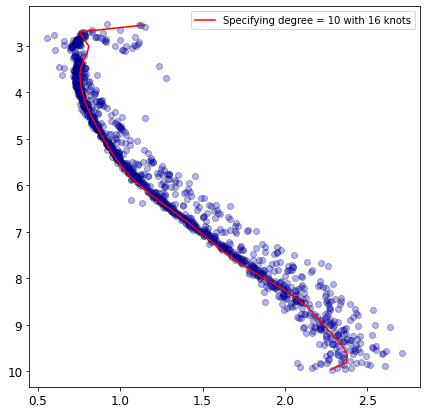

root mean square error for training set  0.09140750142724373
r2 score for training set  0.9718630848876872
root mean square error for training set  0.0955108645806763
r2 score for training set  0.9702457439021577


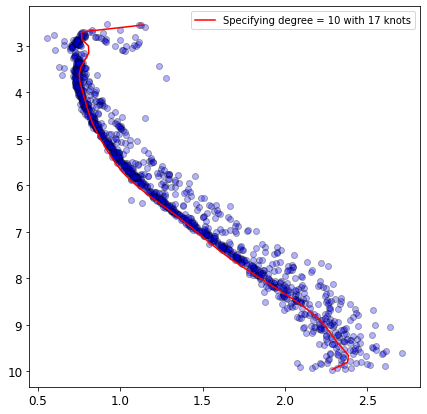

fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09207127623099258
r2 score for training set  0.9714529569013696
root mean square error for training set  0.09409318317815714
r2 score for training set  0.9711224818222379


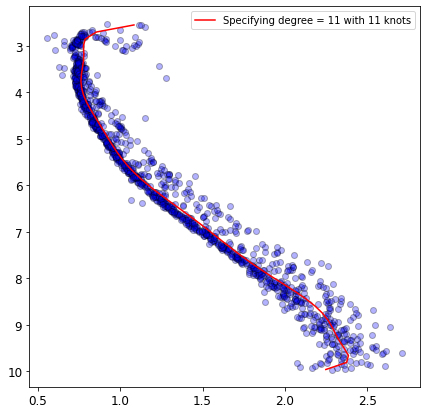

root mean square error for training set  0.0917238659307103
r2 score for training set  0.9716679821822266
root mean square error for training set  0.09397583120380053
r2 score for training set  0.9711944683445415


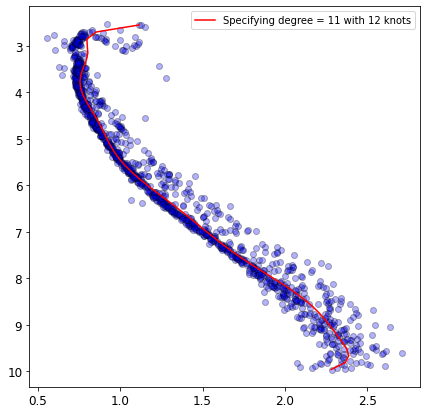

root mean square error for training set  0.09165824779491186
r2 score for training set  0.9717085044429727
root mean square error for training set  0.0940533198244753
r2 score for training set  0.9711469450369704


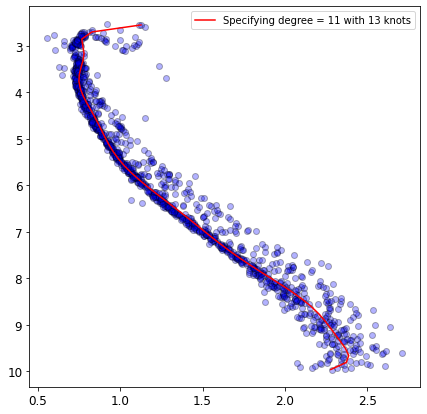

root mean square error for training set  0.09153485044925219
r2 score for training set  0.9717846295173772
root mean square error for training set  0.09473190017516346
r2 score for training set  0.9707291023417923


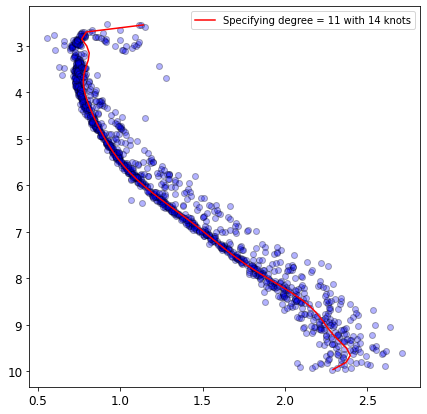

root mean square error for training set  0.09143996995306207
r2 score for training set  0.9718430925152364
root mean square error for training set  0.09520871900334506
r2 score for training set  0.9704336994180451


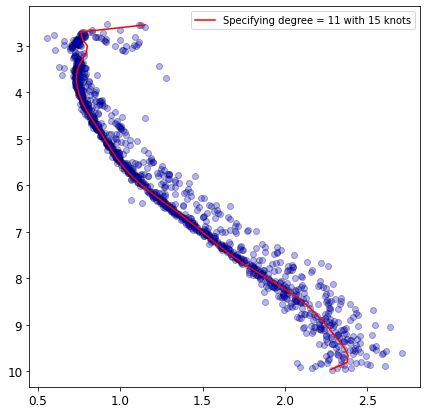

root mean square error for training set  0.09146678861152743
r2 score for training set  0.9718265736729244
root mean square error for training set  0.09508318204981613
r2 score for training set  0.9705116169941661


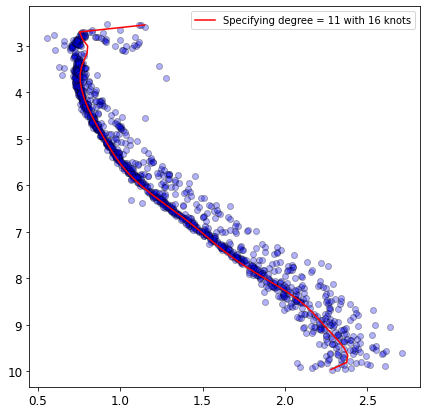

root mean square error for training set  0.0913726199245714
r2 score for training set  0.9718845551302833
root mean square error for training set  0.09487843133851011
r2 score for training set  0.9706384799460865


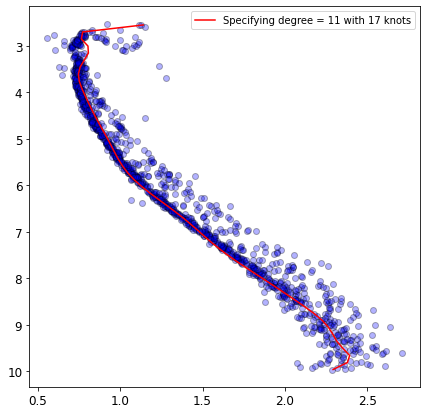

fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09172312831671355
r2 score for training set  0.971668437854448
root mean square error for training set  0.09402562437365801
r2 score for training set  0.9711639349893235


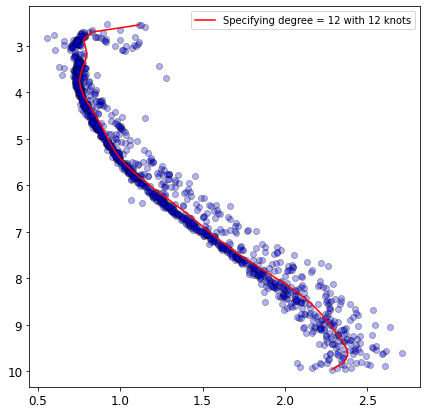

root mean square error for training set  0.09169702404166526
r2 score for training set  0.9716845618062444
root mean square error for training set  0.09395377248810838
r2 score for training set  0.971207989660619


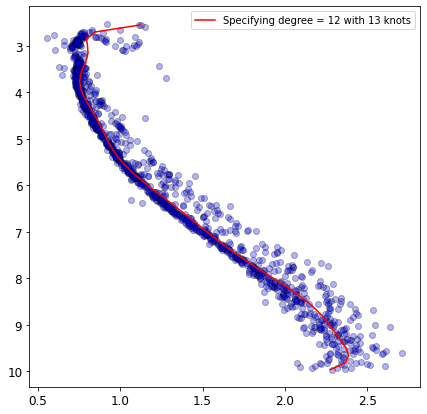

root mean square error for training set  0.09156301158441131
r2 score for training set  0.9717672656590104
root mean square error for training set  0.09413415253116882
r2 score for training set  0.9710973290797505


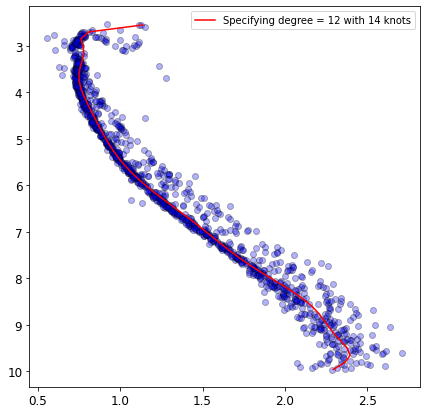

root mean square error for training set  0.0914406763756424
r2 score for training set  0.9718426574592738
root mean square error for training set  0.09524384415576762
r2 score for training set  0.9704118797276842


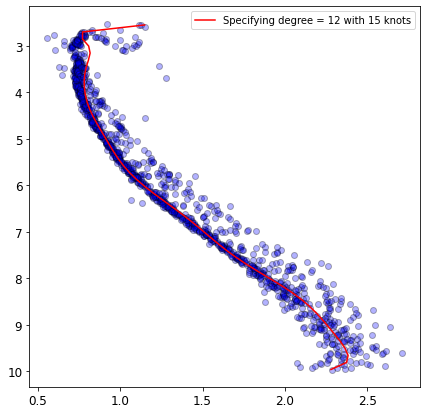

root mean square error for training set  0.09146963075522102
r2 score for training set  0.9718248227823284
root mean square error for training set  0.09509168248604712
r2 score for training set  0.9705063442357544


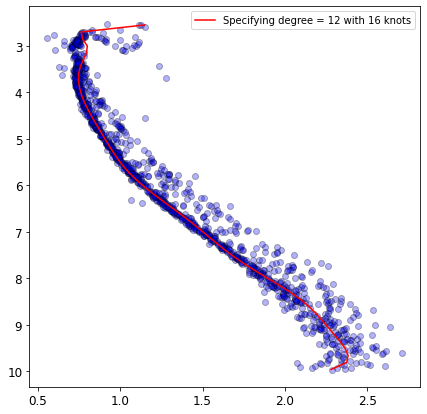

root mean square error for training set  0.09134891032623235
r2 score for training set  0.971899144170616
root mean square error for training set  0.09495996883004126
r2 score for training set  0.9705879923194358


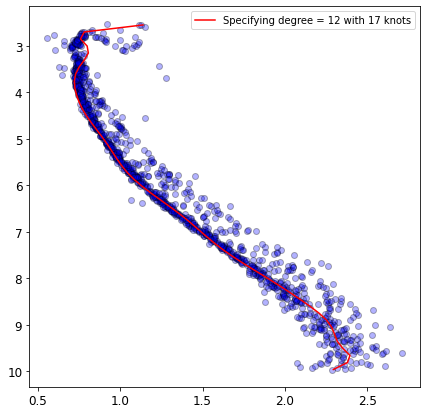

fail
fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.0917040075917771
r2 score for training set  0.9716802486932824
root mean square error for training set  0.09398656800578926
r2 score for training set  0.971187885865764


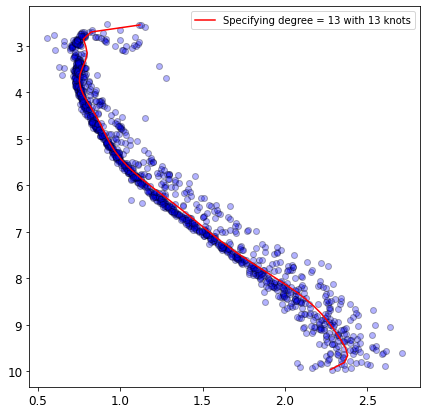

root mean square error for training set  0.09159597700165611
r2 score for training set  0.9717469327452717
root mean square error for training set  0.09403446318463264
r2 score for training set  0.9711585133075358


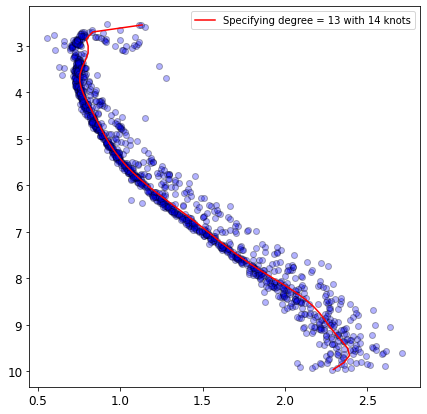

root mean square error for training set  0.09144294698703899
r2 score for training set  0.971841259062429
root mean square error for training set  0.09474269334995254
r2 score for training set  0.9707224320668076


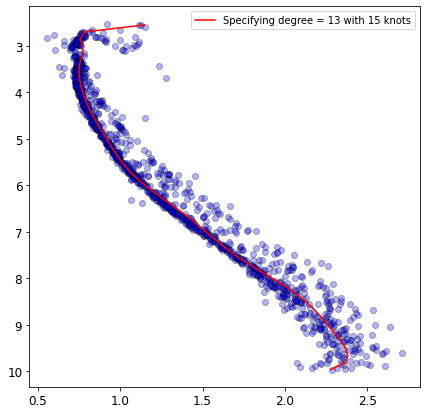

root mean square error for training set  0.09146243099767082
r2 score for training set  0.9718292580568493
root mean square error for training set  0.09504278799974078
r2 score for training set  0.9705366666859356


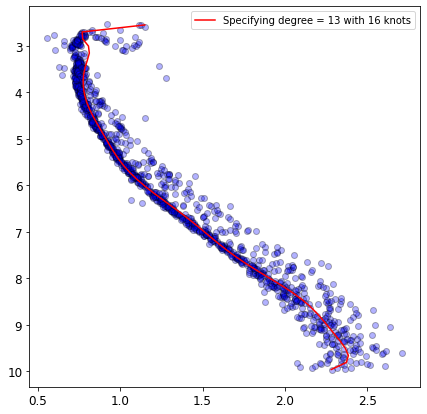

root mean square error for training set  0.09134051188460059
r2 score for training set  0.9719043110094495
root mean square error for training set  0.09533575903334178
r2 score for training set  0.9703547442614869


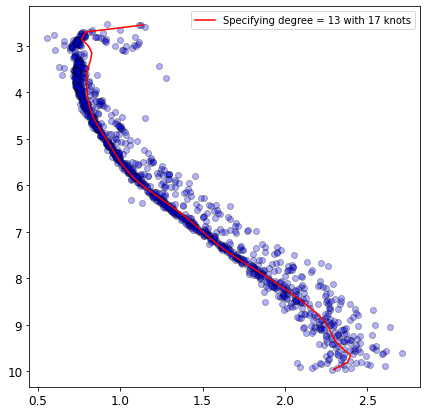

fail
fail
fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09162089753084038
r2 score for training set  0.9717315570226718
root mean square error for training set  0.09398399483573563
r2 score for training set  0.9711894634838419


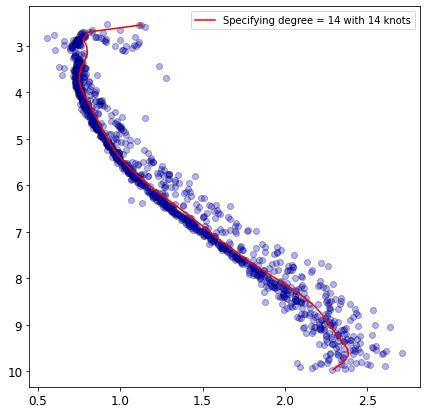

root mean square error for training set  0.09145504308516679
r2 score for training set  0.9718338088777442
root mean square error for training set  0.09472633150158491
r2 score for training set  0.970732543532843


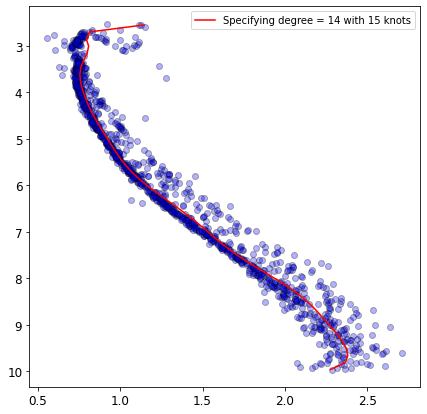

root mean square error for training set  0.09144357857533822
r2 score for training set  0.9718408700812489
root mean square error for training set  0.09458941939271136
r2 score for training set  0.9708170854617166


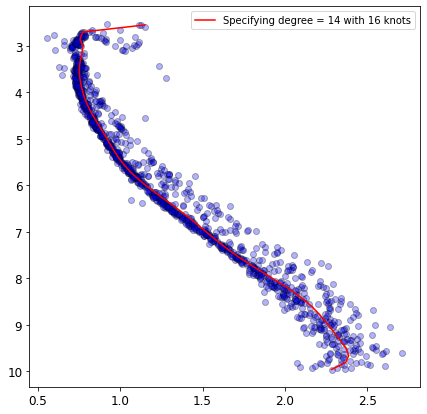

root mean square error for training set  0.09133758483155296
r2 score for training set  0.9719061116618154
root mean square error for training set  0.09459886204198531
r2 score for training set  0.9708112586412748


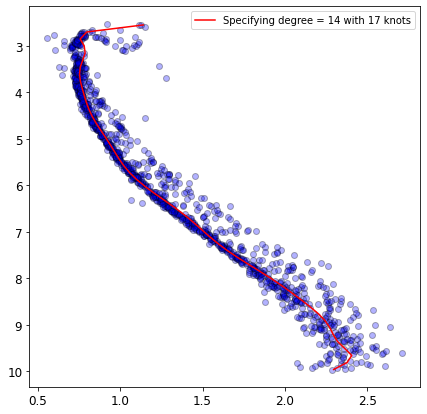

fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09147982126377707
r2 score for training set  0.9718185445154123
root mean square error for training set  0.09474568104418957
r2 score for training set  0.9707205855117412


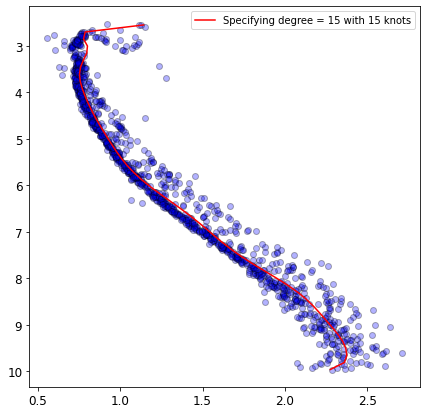

root mean square error for training set  0.09142251642757461
r2 score for training set  0.9718538403403144
root mean square error for training set  0.09454626589009821
r2 score for training set  0.9708437069954619


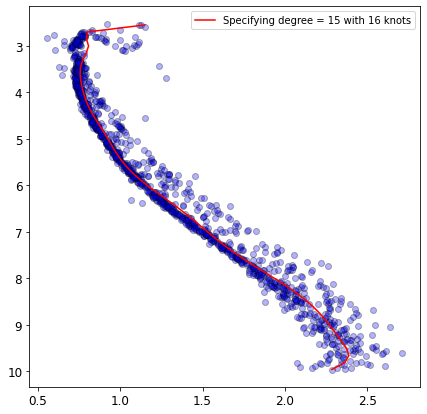

root mean square error for training set  0.09133612913380461
r2 score for training set  0.97190700715044
root mean square error for training set  0.09443253946564939
r2 score for training set  0.9709138069971349


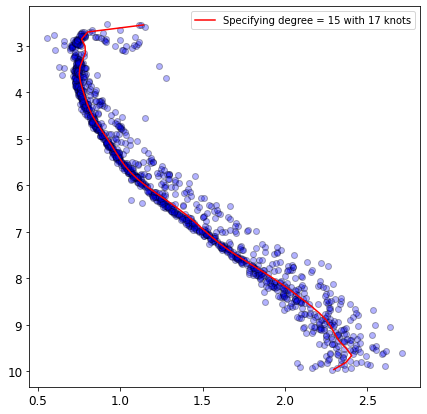

fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09140366529207677
r2 score for training set  0.9718654465044682
root mean square error for training set  0.09456220018142328
r2 score for training set  0.9708338784948527


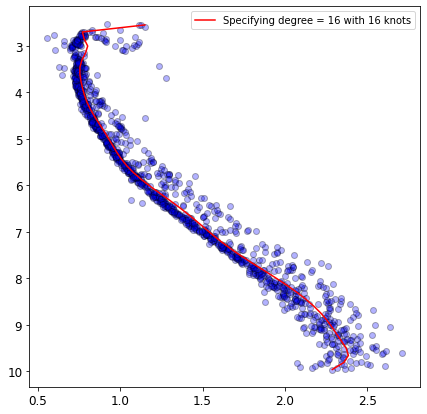

root mean square error for training set  0.09134270035339141
r2 score for training set  0.9719029646785864
root mean square error for training set  0.09444287729786793
r2 score for training set  0.9709074383313447


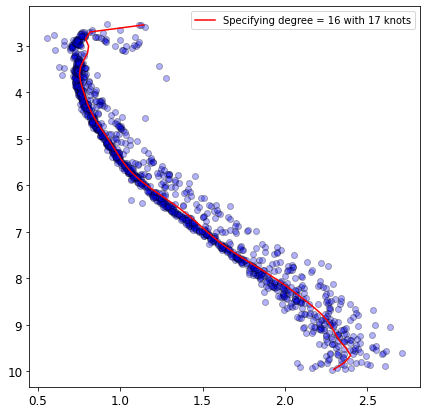

fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
fail
root mean square error for training set  0.09132718613985515
r2 score for training set  0.971912508219247
root mean square error for training set  0.09450452889876232
r2 score for training set  0.9708694431224394


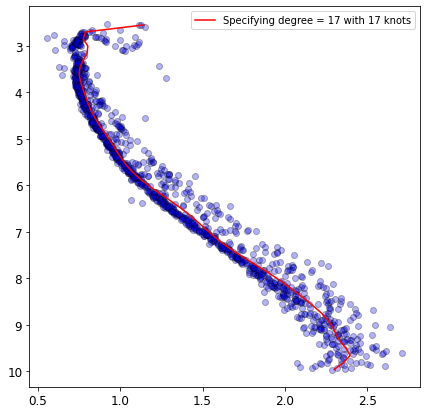

In [103]:
y=member_all['phot_g_mean_mag']
x=member_all['bp_rp']
y=y[x>0.5]

#exchange x and y to provide better spline fit

ya1=x[x>0.5]
xa1=y+5-5*np.log10(distance)

ya1=ya1[xa1>2.5]
xa1=xa1[xa1>2.5]

ya1=ya1[xa1<10.0]
xa1=xa1[xa1<10.0]

print(len(x),len(y))
ax=az.plot_kde(ya1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, values2=ya1, contour=False, pcolormesh_kwargs={'cmap': 'inferno'}, legend=True)

ax.invert_yaxis()
plt.show()
plt.close()

X_train,X_test,y_train,y_test = train_test_split(xa1,ya1, test_size=0.6)

rmse_list=[]
r2_list=[]

a,b=5,18
#degree, knots

for i in range (a,b):
    for j in range (a,b):
        knots = j
        degree = i # try different knots and degree values

        try:
            X_spline = dmatrix('bs(x,df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'x': X_train},return_type = 'dataframe')
            spline_fit = sm.GLM(y_train,X_spline).fit()

            y_pred_train = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_train},return_type = 'dataframe'))
            rmse_train = np.sqrt(mean_squared_error(y_train,y_pred_train))
            print("root mean square error for training set ", rmse_train)   
            print("r2 score for training set ",r2_score(y_train,y_pred_train))


            y_pred = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_test},return_type = 'dataframe'))
            rmse_test = np.sqrt(mean_squared_error(y_test,y_pred))
            print("root mean square error for training set ",rmse_test)
            print("r2 score for training set ",r2_score(y_test,y_pred))

            rmse_list.append ([rmse_train,rmse_test])
            r2_list.append([r2_score(y_train,y_pred_train),r2_score(y_test,y_pred)])

            range_pred = np.linspace(np.min(X_train),np.max(X_train),50)
            prediction = spline_fit.predict(dmatrix('bs(xp, df = '+str(knots)+', degree = '+str(degree)+',include_intercept = False)', {'xp': range_pred},return_type = 'dataframe'))
            plt.figure(figsize=(7,7))
            plt.plot(prediction,range_pred, color='r', label='Specifying degree = '+str(degree)+' with '+str(knots)+' knots')
            plt.scatter(ya1, xa1, color='blue' , alpha=0.3, edgecolor='k')
            #plt.xlabel('Color')
            #plt.ylabel("G")
            plt.legend()
            #plt.scatter(member_all['bp_rp'].tolist(), member_all['phot_g_mean_mag'].tolist(), facecolor='None', c='w', alpha=0.5, s = 20)
            ax = plt.gca()
            ax.invert_yaxis()
            plt.show()
            plt.close()
            
        except:
            print ("fail")



rmse_list=np.array(rmse_list)
r2_list=np.array(r2_list)

#print (np.max(range_pred),np.min(range_pred))
#print (rmse_list)

#print ("            ")

#print (r2_list)


#print (min(rmse_list[:,1]))




1359 1347


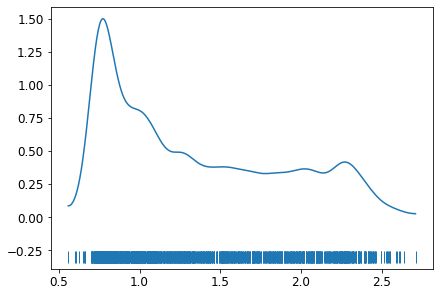

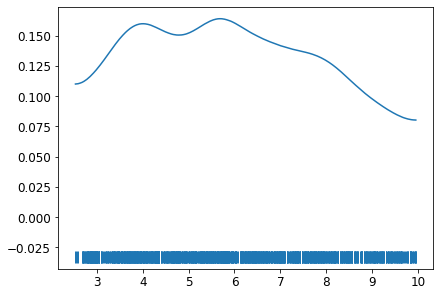

/Users/esanmoulighosh/opt/anaconda3/envs/astrostat/lib/python3.9/site-packages/arviz/plots/backends/matplotlib/kdeplot.py:173: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_x, y_y, density, **pcolormesh_kwargs)


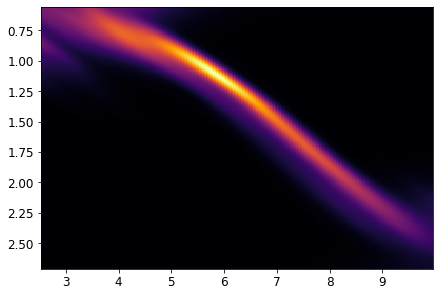

root mean square error for training set  0.09189206999772787
r2 score for training set  0.9703819192926394
root mean square error for training set  0.09728071185171129
r2 score for training set  0.9698166285833532


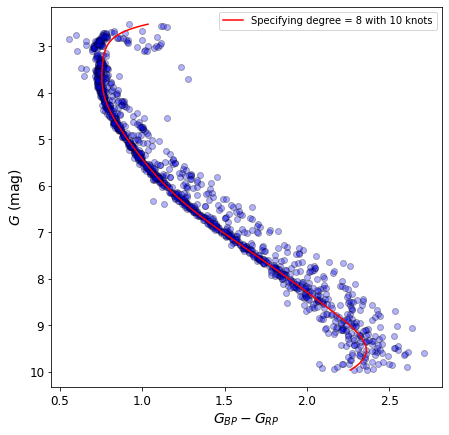

In [104]:
y=member_all['phot_g_mean_mag']
x=member_all['bp_rp']
y=y[x>0.5]
ya1=x[x>0.5]
xa1=y+5-5*np.log10(distance)

ya1=ya1[xa1>2.5]
xa1=xa1[xa1>2.5]

ya1=ya1[xa1<10.0]
xa1=xa1[xa1<10.0]

print(len(x),len(y))
ax=az.plot_kde(ya1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, values2=ya1, contour=False, pcolormesh_kwargs={'cmap': 'inferno'}, legend=True)

ax.invert_yaxis()
plt.show()
plt.close()

X_train,X_test,y_train,y_test = train_test_split(xa1,ya1, test_size=0.6)

rmse_list=[]
r2_list=[]

degree=8
knots=10
#degree, knots


X_spline = dmatrix('bs(x,df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'x': X_train},return_type = 'dataframe')
spline_fit = sm.GLM(y_train,X_spline).fit()

y_pred_train = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_train},return_type = 'dataframe'))
rmse_train = np.sqrt(mean_squared_error(y_train,y_pred_train))
print("root mean square error for training set ", rmse_train)   
print("r2 score for training set ",r2_score(y_train,y_pred_train))


y_pred = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_test},return_type = 'dataframe'))
rmse_test = np.sqrt(mean_squared_error(y_test,y_pred))
print("root mean square error for training set ",rmse_test)
print("r2 score for training set ",r2_score(y_test,y_pred))

rmse_list.append ([rmse_train,rmse_test])
r2_list.append([r2_score(y_train,y_pred_train),r2_score(y_test,y_pred)])

range_pred = np.linspace(np.min(X_train),np.max(X_train),500)
prediction = spline_fit.predict(dmatrix('bs(xp, df = '+str(knots)+', degree = '+str(degree)+',include_intercept = False)', {'xp': range_pred},return_type = 'dataframe'))
plt.figure(figsize=(7,7))
plt.plot(prediction,range_pred, color='r', label='Specifying degree = '+str(degree)+' with '+str(knots)+' knots')
plt.scatter(ya1, xa1, color='blue' , alpha=0.3, edgecolor='k')
#plt.xlabel('Color')
#plt.ylabel("G")
plt.legend()
#plt.scatter(member_all['bp_rp'].tolist(), member_all['phot_g_mean_mag'].tolist(), facecolor='None', c='w', alpha=0.5, s = 20)
ax = plt.gca()
ax.invert_yaxis()
plt.xlabel(r"$G_{BP}-G_{RP}$")
plt.ylabel(r"$G$ (mag)")

plt.show()
plt.close()
            

1359 1347


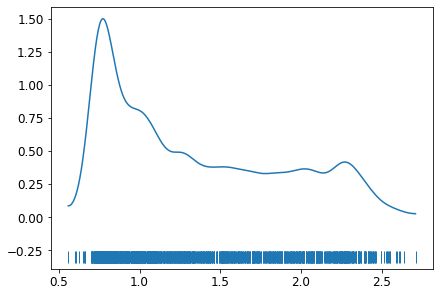

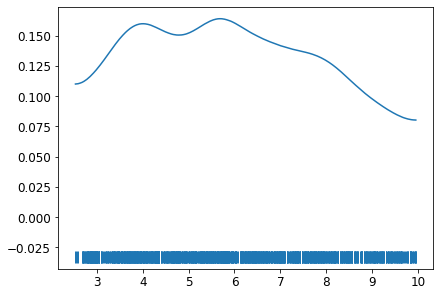

/Users/esanmoulighosh/opt/anaconda3/envs/astrostat/lib/python3.9/site-packages/arviz/plots/backends/matplotlib/kdeplot.py:173: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(x_x, y_y, density, **pcolormesh_kwargs)


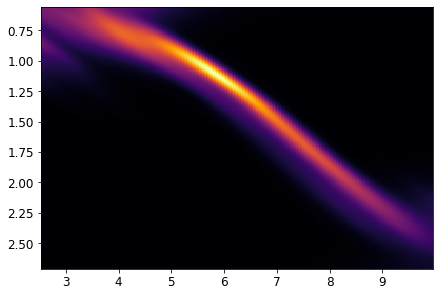

root mean square error for training set  0.09005635902540611
r2 score for training set  0.9730295915775505
root mean square error for training set  0.09519019113384147
r2 score for training set  0.9702045008015511


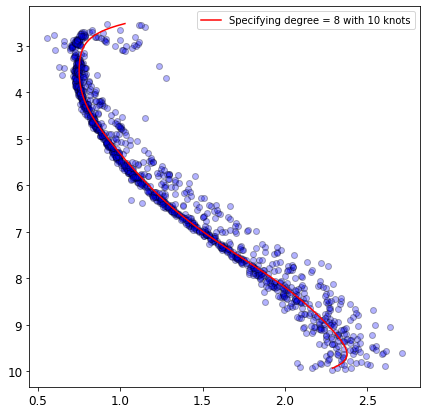

Reading in: /Users/esanmoulighosh/Astrostat_IVC/Av0.2.cmd


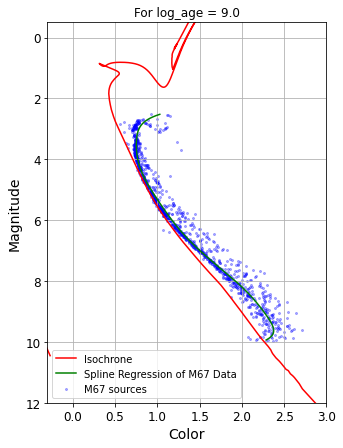

500 500
218 218


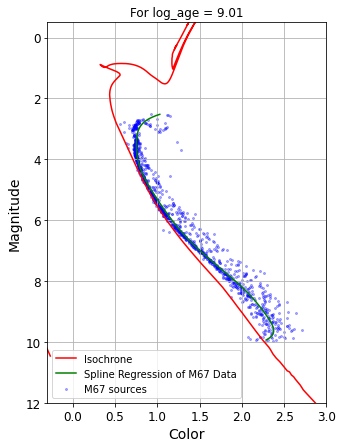

493 493
219 219


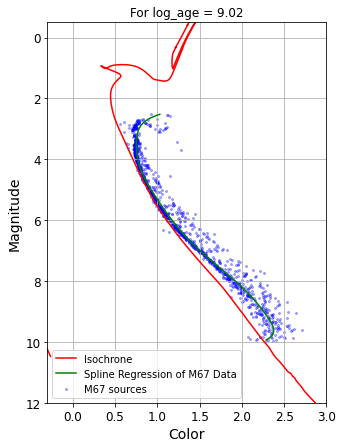

494 494
220 220


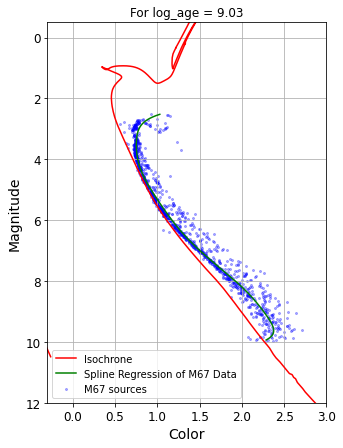

500 500
220 220


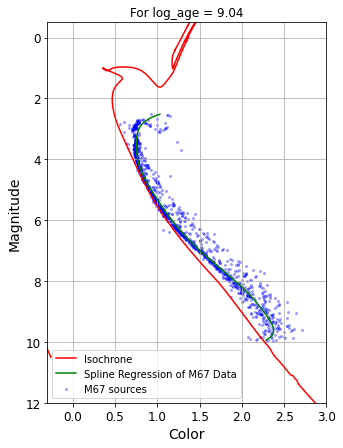

500 500
221 221


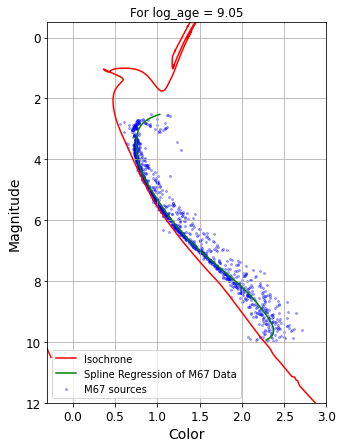

500 500
220 220


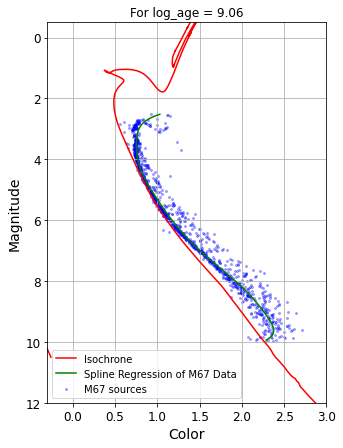

500 500
220 220


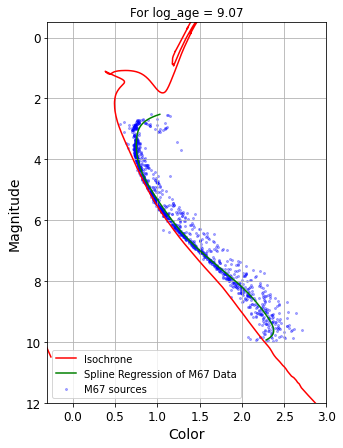

500 500
221 221


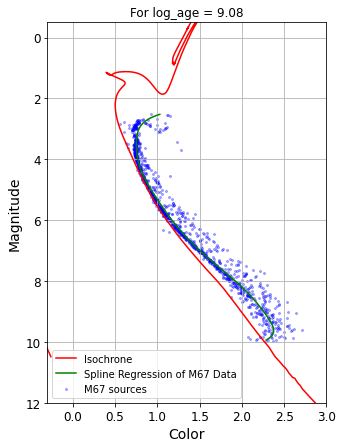

500 500
222 222


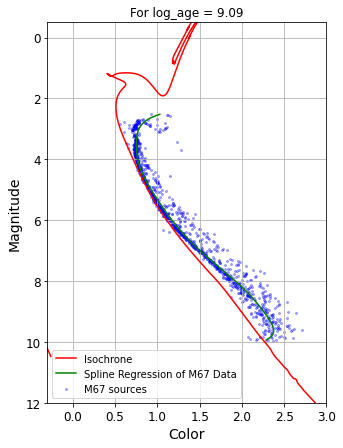

500 500
222 222


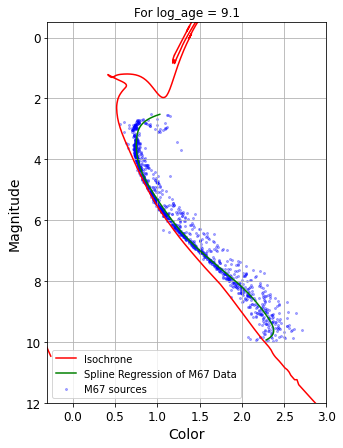

500 500
222 222


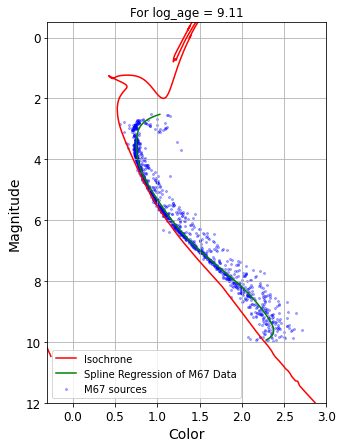

500 500
221 221


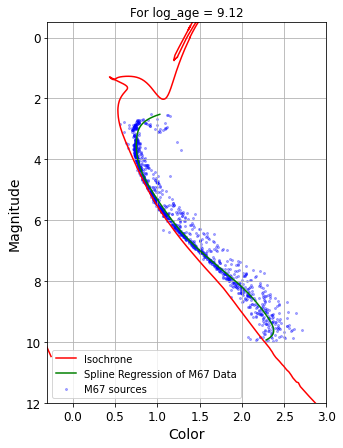

499 499
222 222


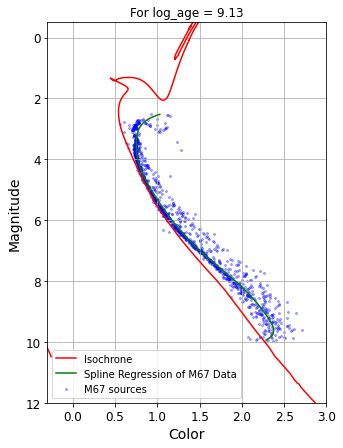

497 497
223 223


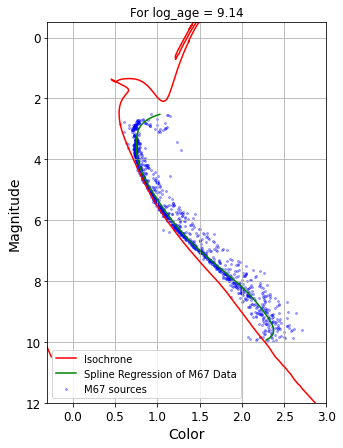

495 495
222 222


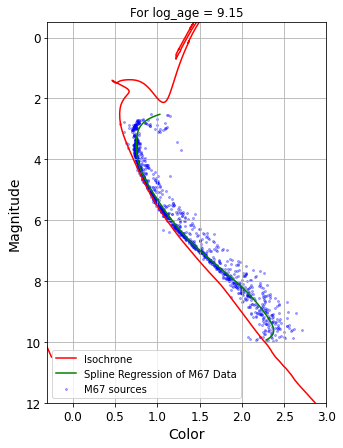

493 493
222 222


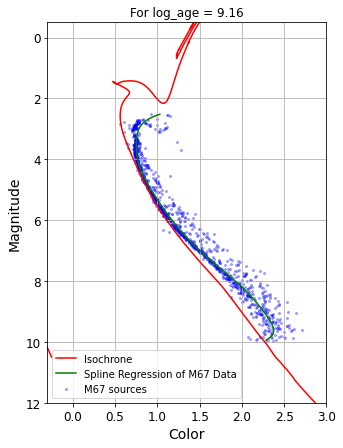

488 488
223 223


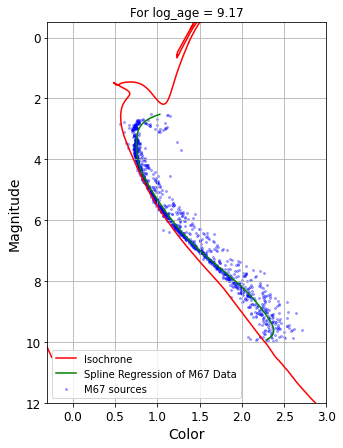

481 481
226 226


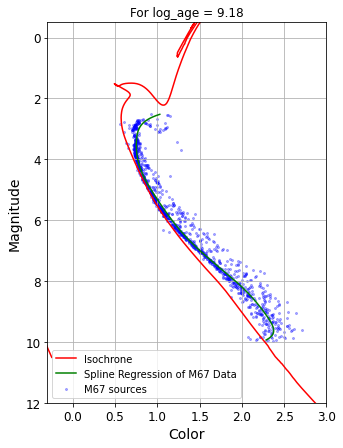

473 473
228 228


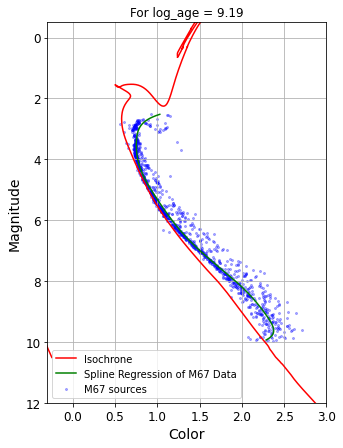

473 473
229 229


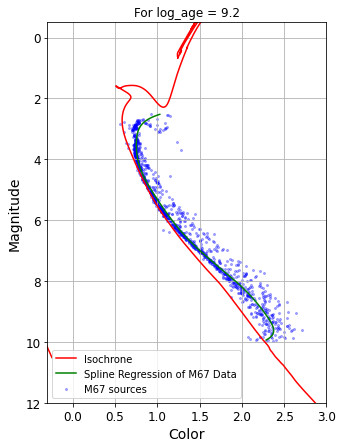

471 471
230 230


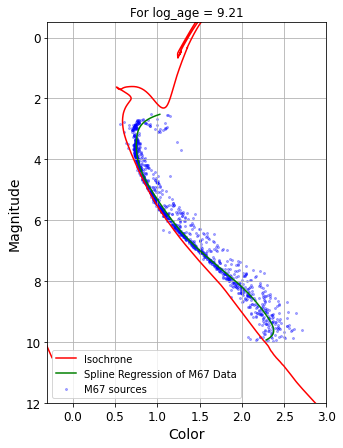

462 462
231 231


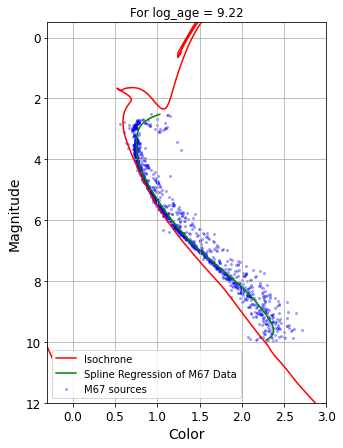

454 454
233 233


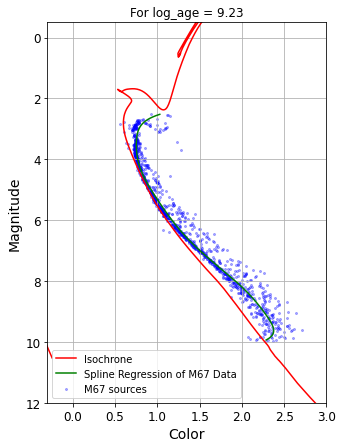

450 450
235 235


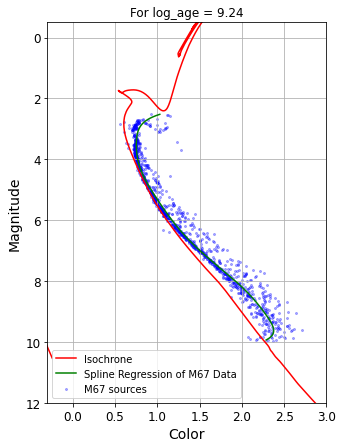

445 445
235 235


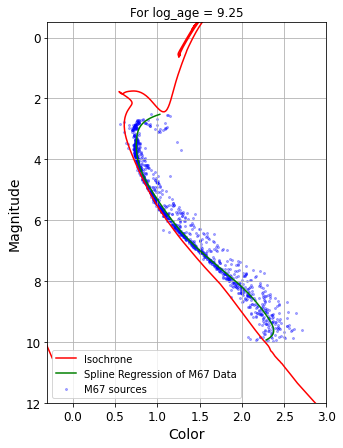

448 448
234 234


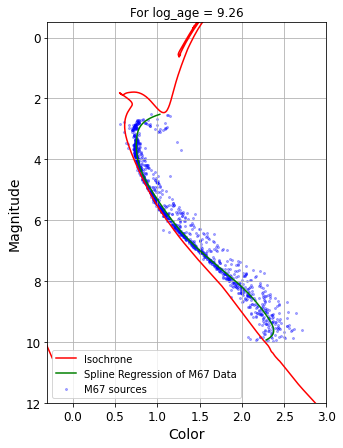

447 447
239 239


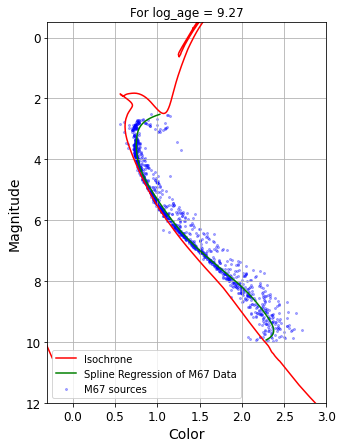

448 448
242 242


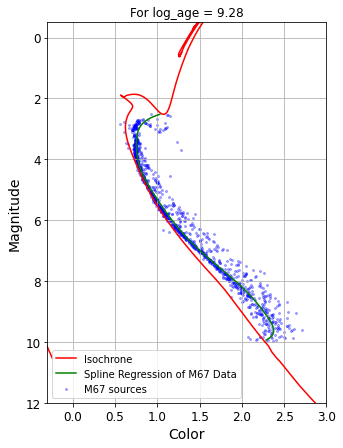

449 449
247 247


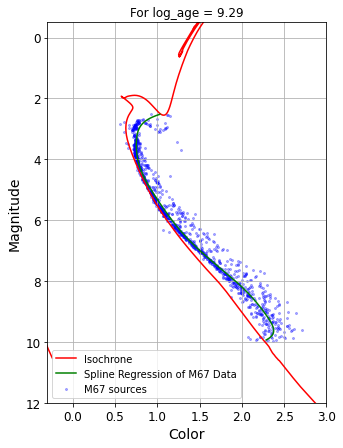

452 452
253 253


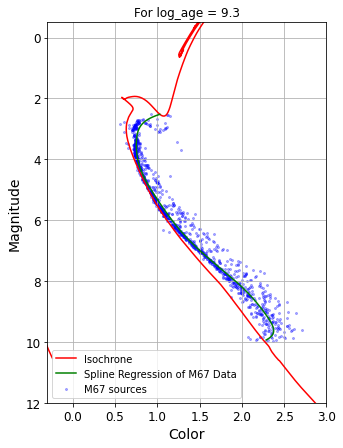

456 456
257 257


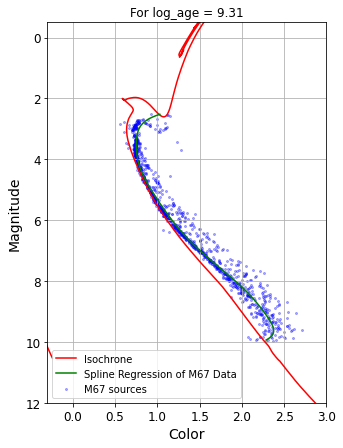

451 451
259 259


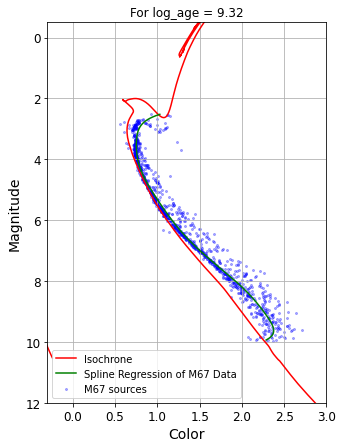

448 448
261 261


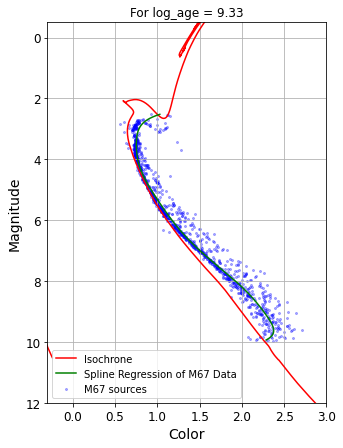

444 444
261 261


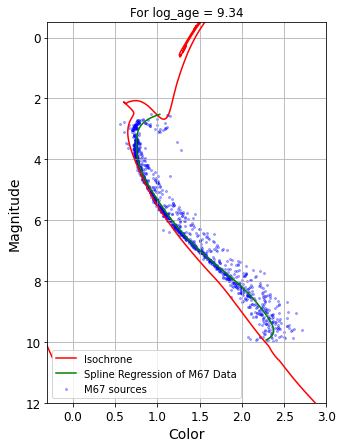

442 442
259 259


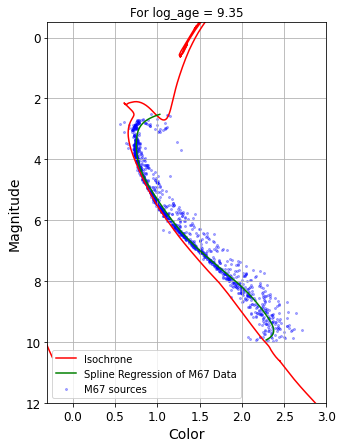

442 442
255 255


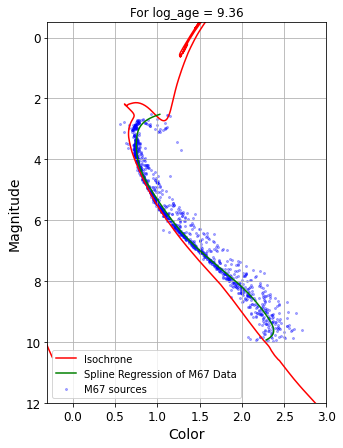

442 442
263 263


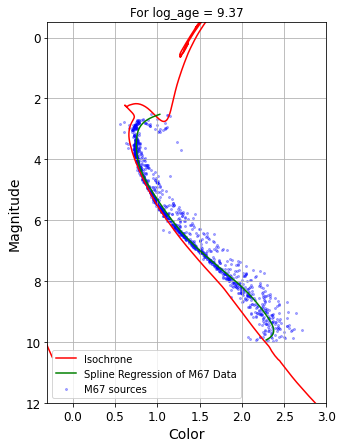

444 444
269 269


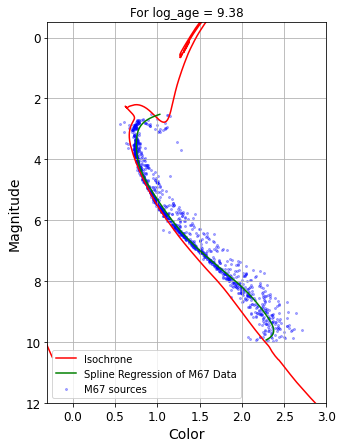

443 443
275 275


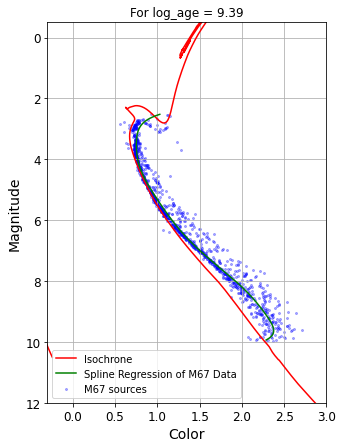

445 445
280 280


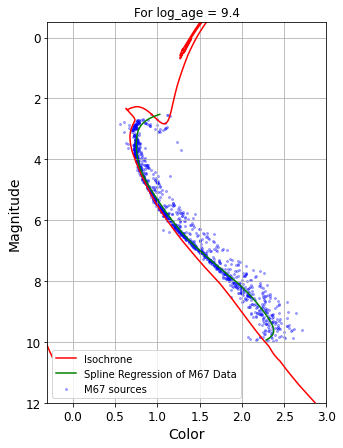

445 445
285 285


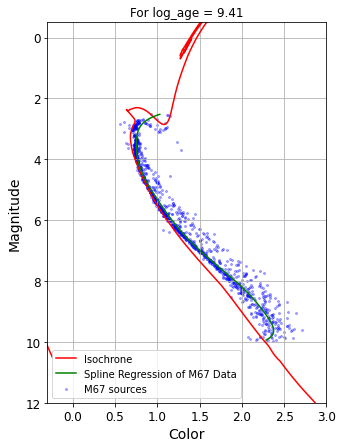

447 447
289 289


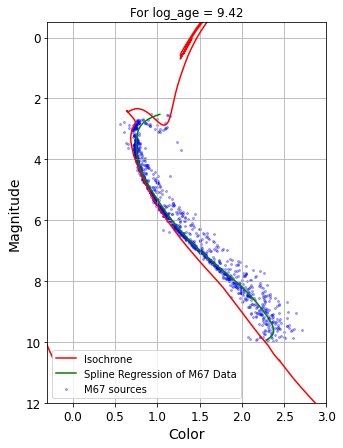

449 449
293 293


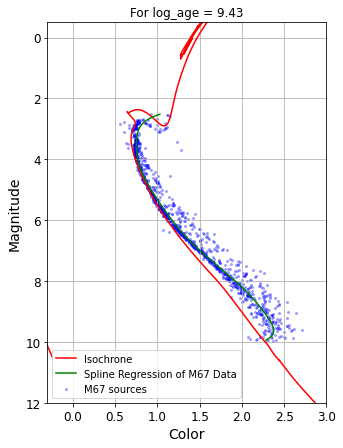

449 449
297 297


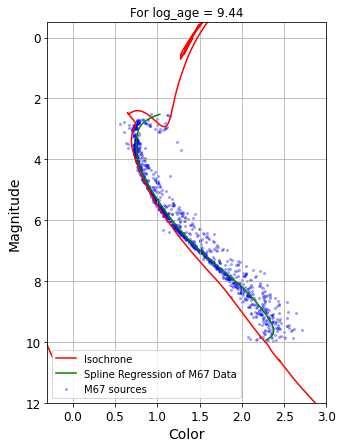

451 451
300 300


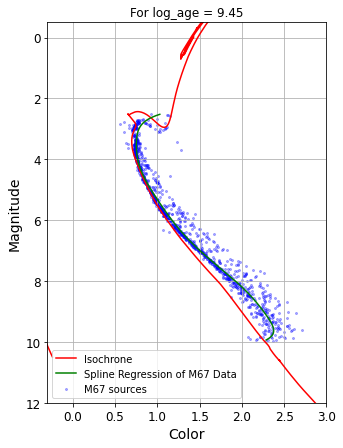

455 455
310 310


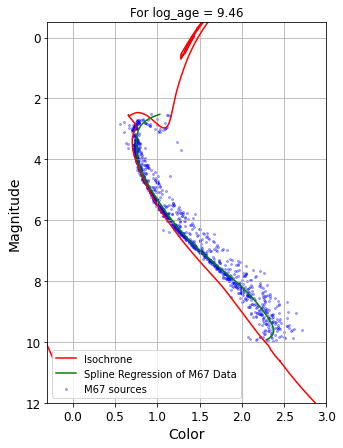

454 454
329 329


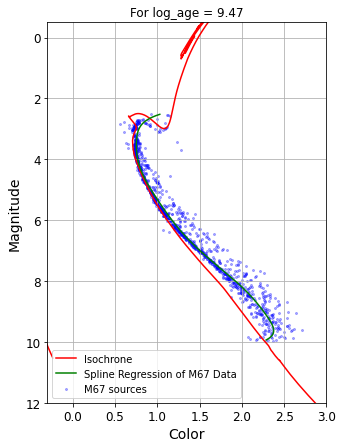

454 454
336 336


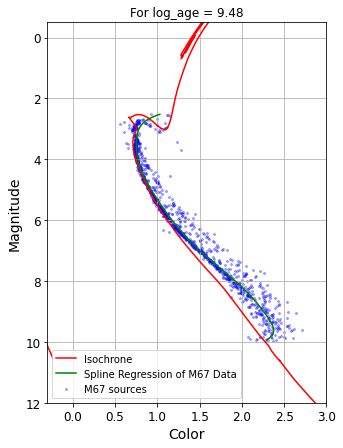

458 458
346 346


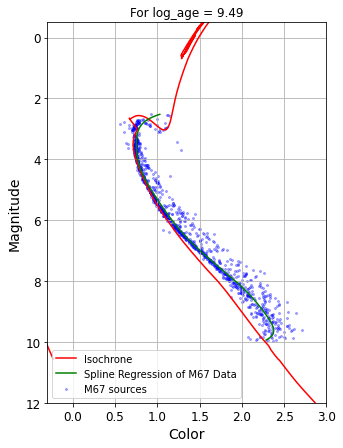

462 462
345 345


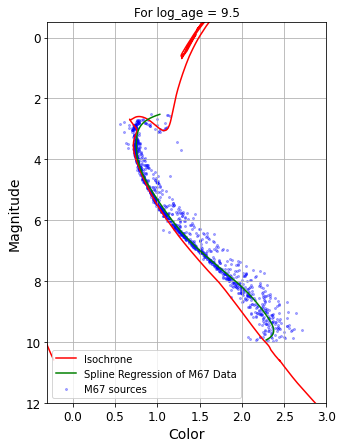

466 466
345 345


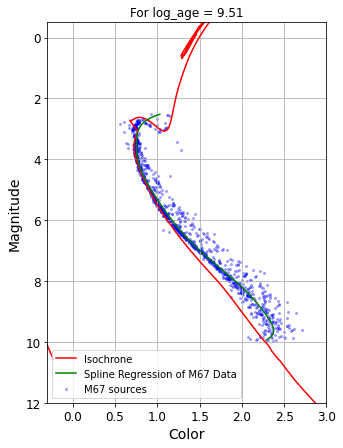

468 468
347 347


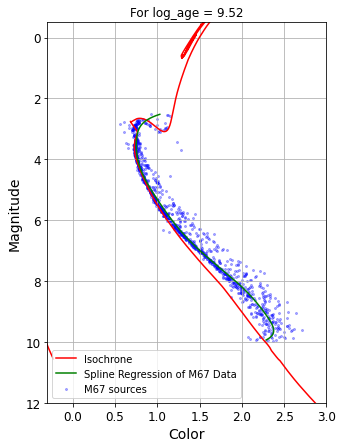

471 471
346 346


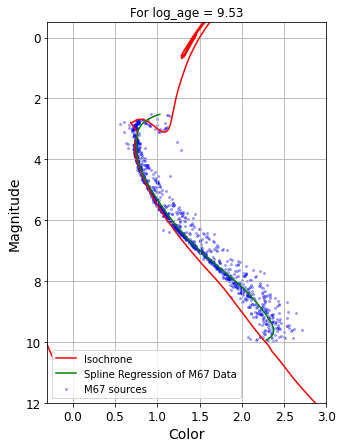

475 475
346 346


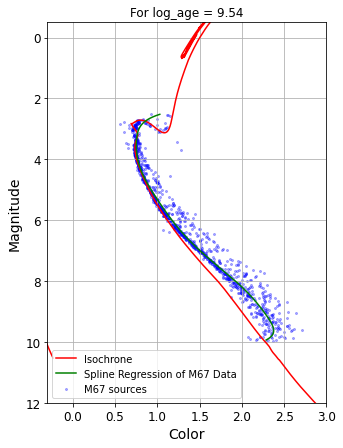

480 480
346 346


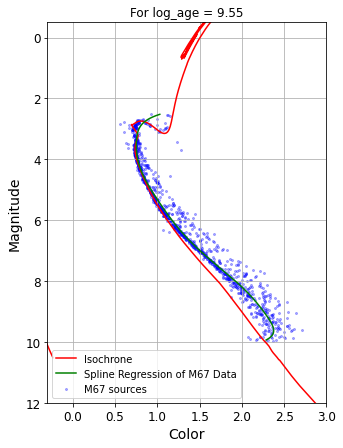

483 483
345 345


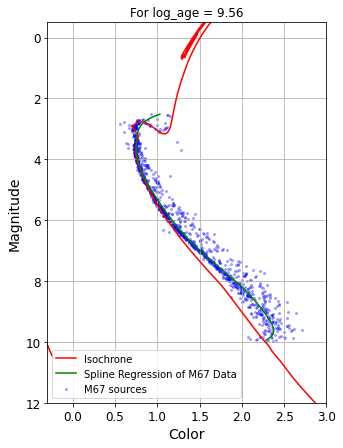

486 486
345 345


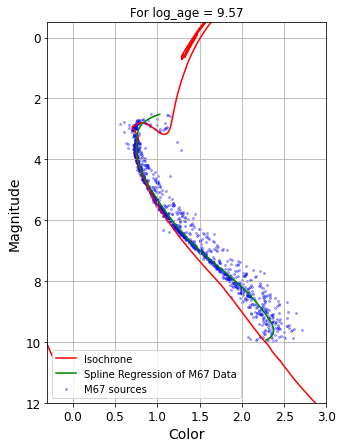

490 490
344 344


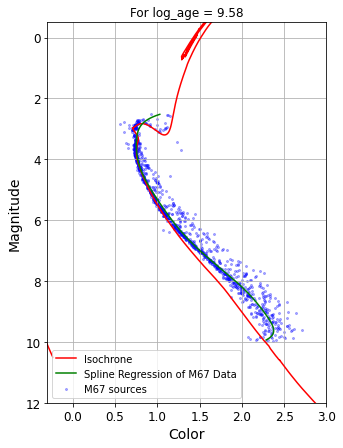

498 498
344 344


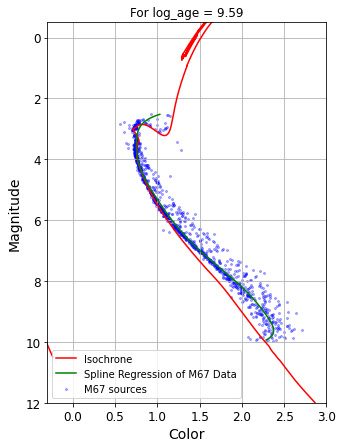

500 500
344 344


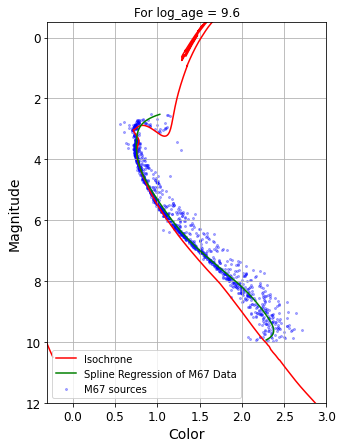

500 500
342 342


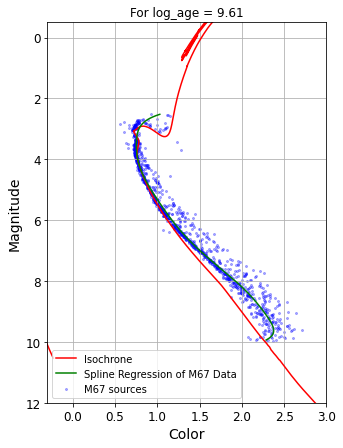

500 500
339 339


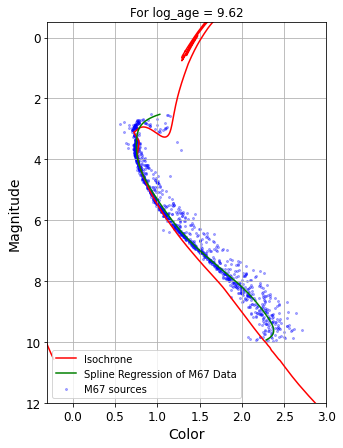

500 500
334 334


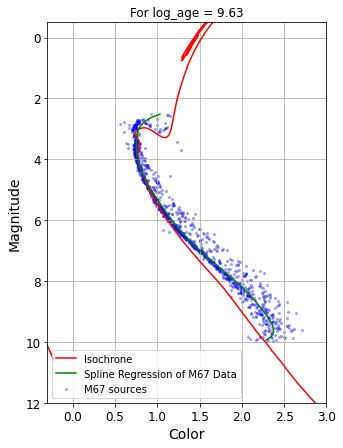

500 500
330 330


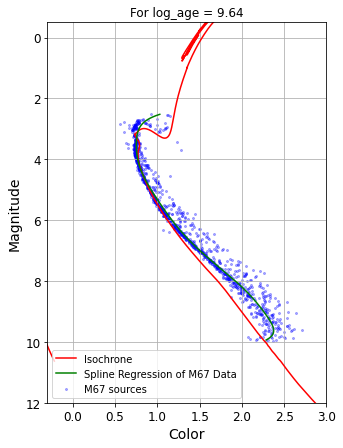

500 500
326 326


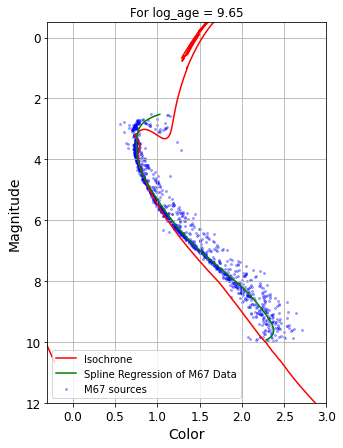

500 500
322 322


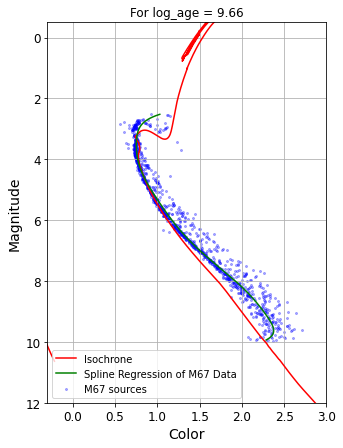

500 500
323 323


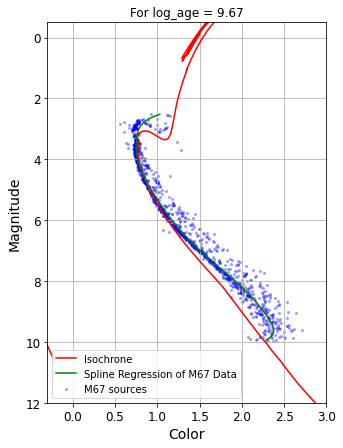

500 500
323 323


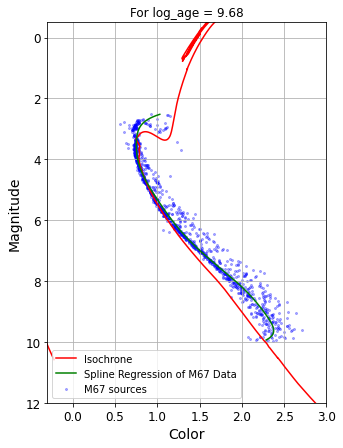

500 500
324 324


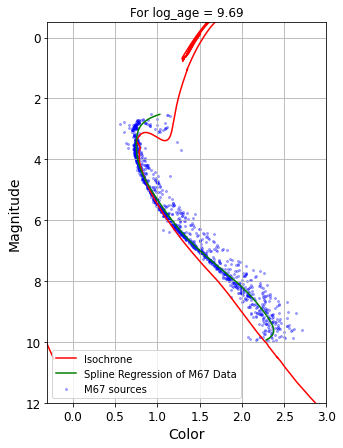

500 500
325 325


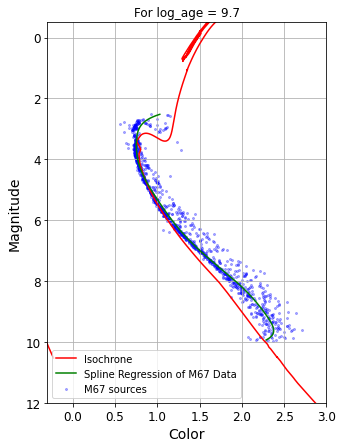

500 500
325 325


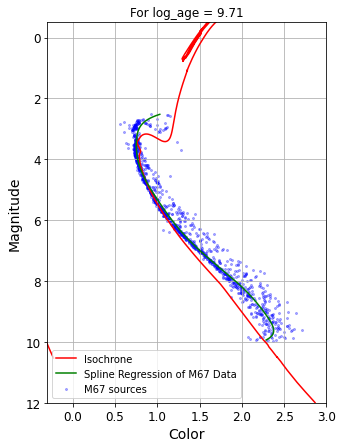

500 500
328 328


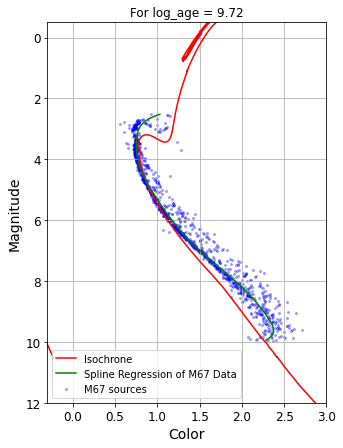

500 500
330 330


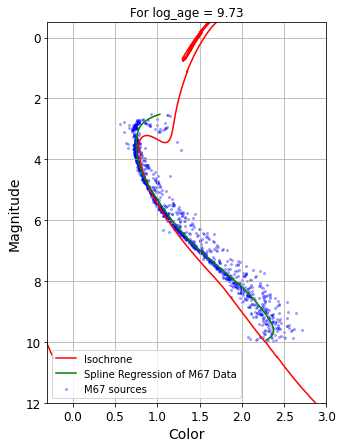

500 500
329 329


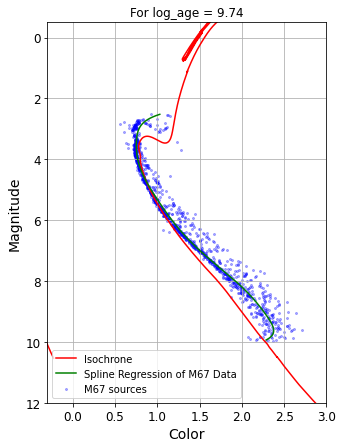

500 500
331 331


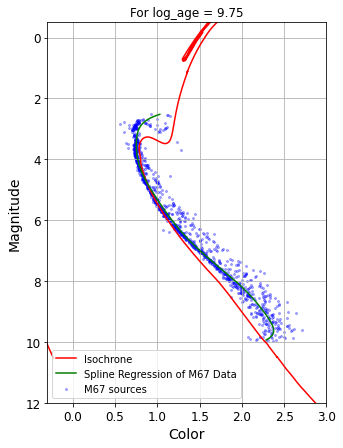

500 500
329 329


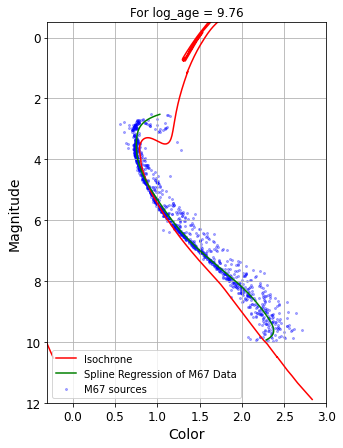

500 500
330 330


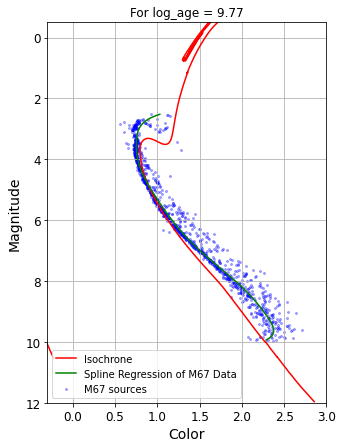

500 500
330 330


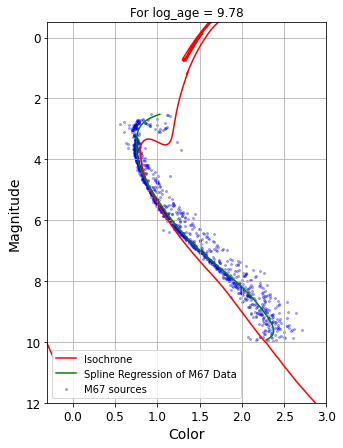

500 500
331 331


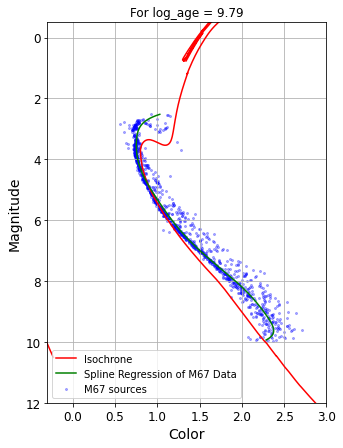

500 500
331 331


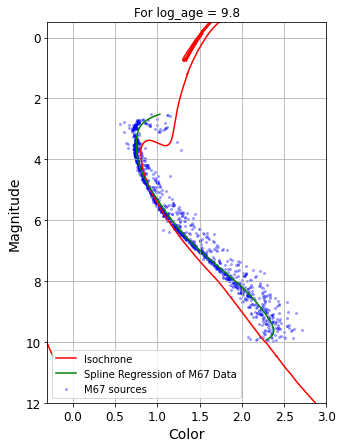

500 500
330 330


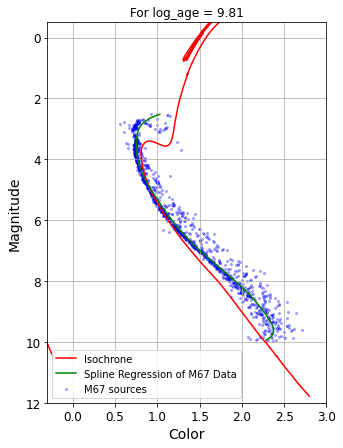

500 500
330 330


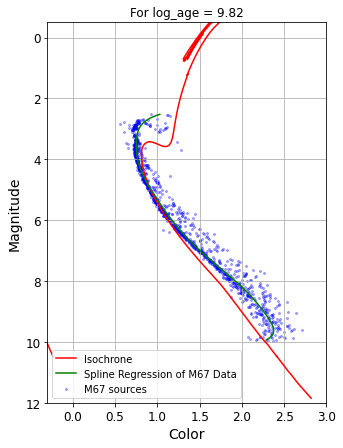

500 500
329 329


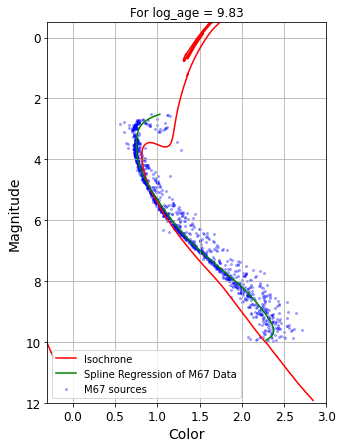

500 500
329 329


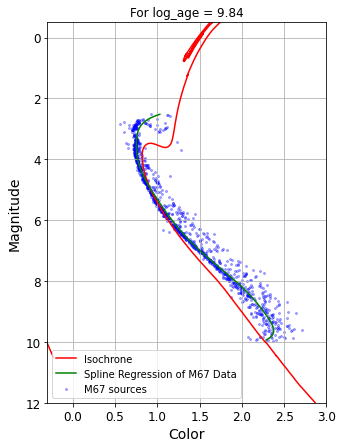

500 500
328 328


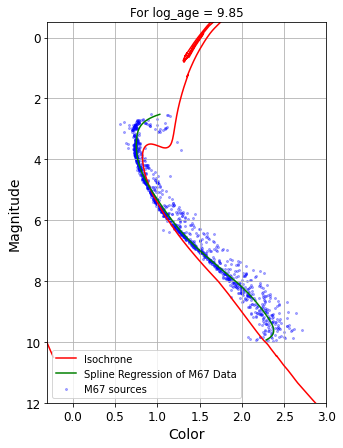

500 500
325 325


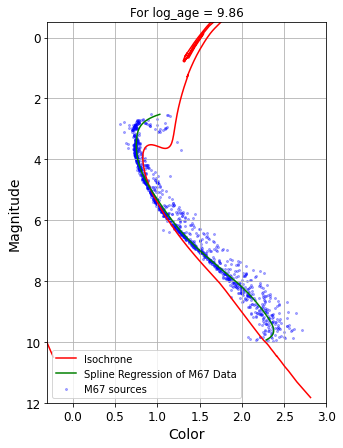

500 500
324 324


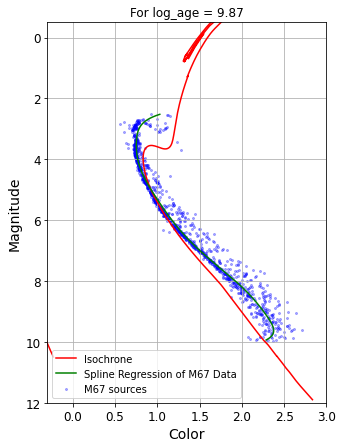

500 500
325 325


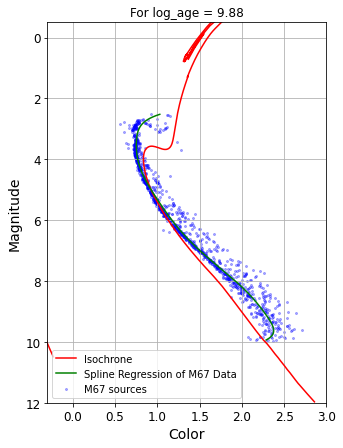

500 500
324 324


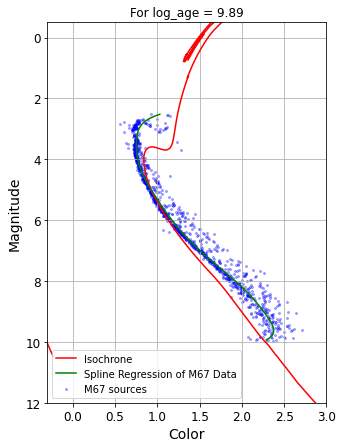

500 500
321 321


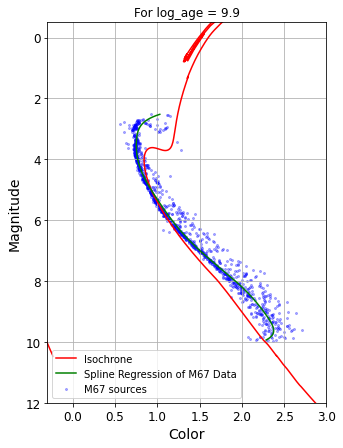

500 500
318 318


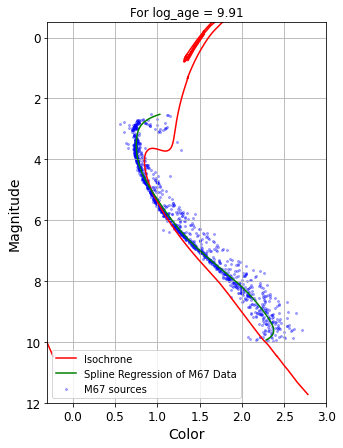

500 500
319 319


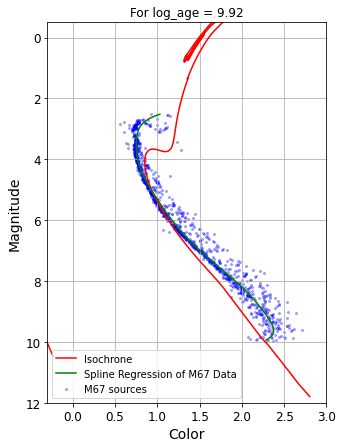

500 500
320 320


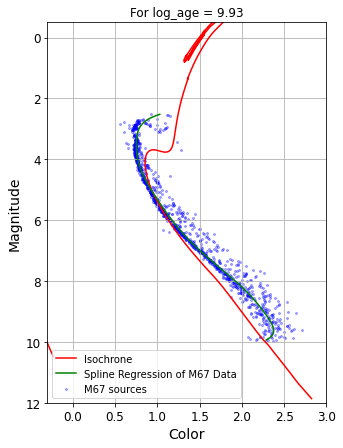

500 500
321 321


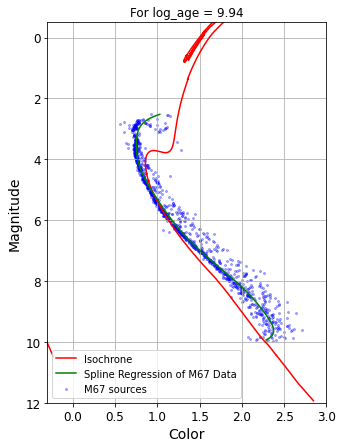

500 500
321 321


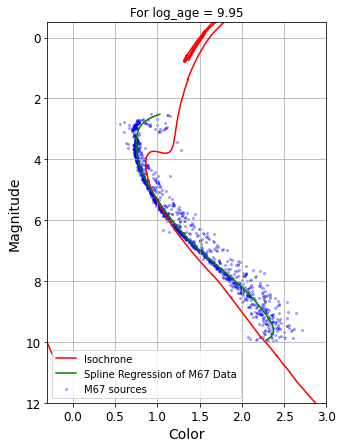

500 500
321 321


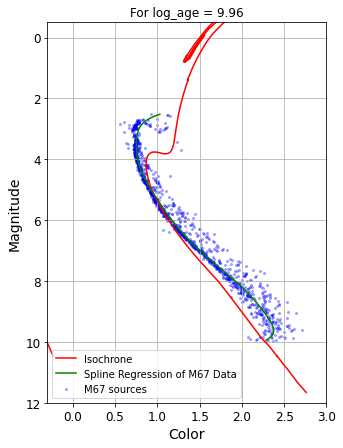

500 500
320 320


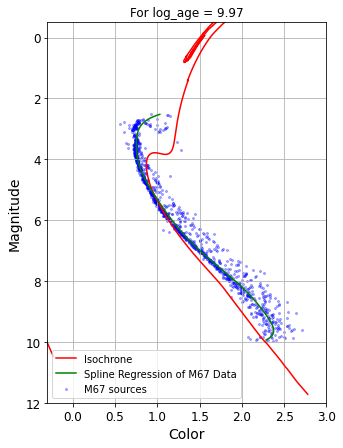

500 500
316 316


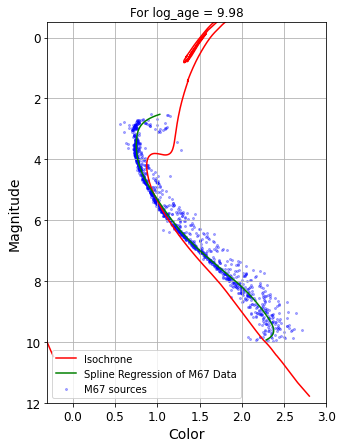

500 500
315 315


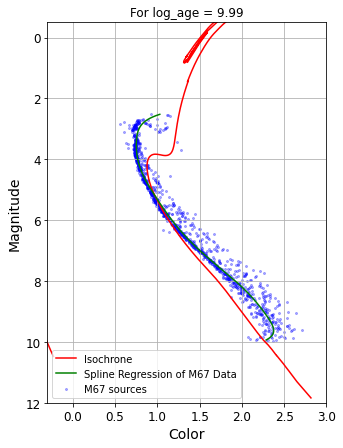

500 500
311 311
[3.4282431855399427, 3.4381889112522477, 3.4721900329041855, 3.4845189174437667, 3.43039183114697, 3.452408726644175, 3.4456712893477803, 3.468048219986636, 3.486878161192414, 3.4895520088866867, 3.487120298578621, 3.494203768283516, 3.553153323535141, 3.574183364170371, 3.574726217191342, 3.556952911400635, 3.541752449084494, 3.529555635483295, 3.534169131097796, 3.518352701727365, 3.4974146225116596, 3.427359012364505, 3.3431729277490727, 3.2989127098927646, 3.2318572227822875, 3.187298037159751, 3.2125599398269546, 3.2170911196250547, 3.2486699387899343, 3.2382439079702805, 3.2580391523028815, 3.1830616998563763, 3.1175890506681916, 3.1135572273119974, 3.1214013644348473, 3.1553010832298525, 3.1242086178603707, 3.0850931148754976, 3.0679659913622253, 3.0358852846727578, 3.0119340290260164, 3.031136192888825, 3.0184556283247517, 3.0393680949264543, 3.0345622399481638, 3.029546761896759, 3.0203659668446043, 2.9996153655727835, 3.014314177546627, 2.991941746790679, 2.96

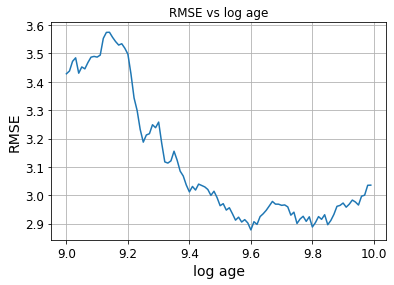

IndexError: invalid index to scalar variable.

In [109]:
##rmse for all age##
from scipy import interpolate 

y=member_all['phot_g_mean_mag']
x=member_all['bp_rp']
y=y[x>0.5]
ya1=x[x>0.5]
xa1=y+5-5*np.log10(distance)

ya1=ya1[xa1>2.5]
xa1=xa1[xa1>2.5]

ya1=ya1[xa1<10.0]
xa1=xa1[xa1<10.0]

print(len(x),len(y))
ax=az.plot_kde(ya1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, rug=True)
plt.show()
plt.close()

ax=az.plot_kde(xa1, values2=ya1, contour=False, pcolormesh_kwargs={'cmap': 'inferno'}, legend=True)

ax.invert_yaxis()
plt.show()
plt.close()

X_train,X_test,y_train,y_test = train_test_split(xa1,ya1, test_size=0.6)

rmse_list=[]
r2_list=[]

degree=8
knots=10
#degree, knots


X_spline = dmatrix('bs(x,df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'x': X_train},return_type = 'dataframe')
spline_fit = sm.GLM(y_train,X_spline).fit()

y_pred_train = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_train},return_type = 'dataframe'))
rmse_train = np.sqrt(mean_squared_error(y_train,y_pred_train))
print("root mean square error for training set ", rmse_train)   
print("r2 score for training set ",r2_score(y_train,y_pred_train))


y_pred = spline_fit.predict(dmatrix('bs(test, df = '+str(knots)+', degree = '+str(degree)+', include_intercept = False)', {'test': X_test},return_type = 'dataframe'))
rmse_test = np.sqrt(mean_squared_error(y_test,y_pred))
print("root mean square error for training set ",rmse_test)
print("r2 score for training set ",r2_score(y_test,y_pred))

rmse_list.append ([rmse_train,rmse_test])
r2_list.append([r2_score(y_train,y_pred_train),r2_score(y_test,y_pred)])

range_pred = np.linspace(np.min(X_train),np.max(X_train),500)
prediction = spline_fit.predict(dmatrix('bs(xp, df = '+str(knots)+', degree = '+str(degree)+',include_intercept = False)', {'xp': range_pred},return_type = 'dataframe'))
plt.figure(figsize=(7,7))
plt.plot(prediction,range_pred, color='r', label='Specifying degree = '+str(degree)+' with '+str(knots)+' knots')
plt.scatter(ya1, xa1, color='blue' , alpha=0.3, edgecolor='k')
#plt.xlabel('Color')
#plt.ylabel("G")
plt.legend()
#plt.scatter(member_all['bp_rp'].tolist(), member_all['phot_g_mean_mag'].tolist(), facecolor='None', c='w', alpha=0.5, s = 20)
ax = plt.gca()
ax.invert_yaxis()
plt.show()
plt.close()

#filename = '/Users/esanmoulighosh/Astrostat_IVC/MIST_iso_6114f8e500afe.iso.cmd'
filename = '/Users/esanmoulighosh/Astrostat_IVC/Av0.2.cmd'
iso = ISOCMD(filename)

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

rmse_l=[]
age_range=np.arange(9.0,10.00,0.01)
for i in age_range:
    age_i=iso.age_index(i)
    iso_G=iso.isocmds[age_i]['Gaia_G_EDR3']
    iso_RP=iso.isocmds[age_i]['Gaia_RP_EDR3']
    iso_BP=iso.isocmds[age_i]['Gaia_BP_EDR3']
    
    B_R=iso_BP-iso_RP
    plt.figure(figsize=(5,7))
    plt.plot(B_R,iso_G, c='red', label="Isochrone")
    ax=plt.gca()
    plt.ylim(-0.5,12)
    plt.xlim(-0.3,3)
    plt.scatter(ya1,xa1, color='blue' , alpha=0.3, s=4, label="M67 sources")
    plt.plot(prediction,range_pred,color='green', label='Spline Regression of M67 Data')
    
    ax.invert_yaxis()
    plt.xlabel("Color")
    plt.ylabel("Magnitude")
    plt.title("For log_age = " + str(round(i,2)))
    plt.grid()
    plt.legend()
    plt.show()
    plt.close()
    
    B_R=B_R[B_R>min(prediction)]
    B_R=B_R[B_R<max(prediction)]
    
    if len(B_R)>len(prediction):
        B_R=B_R[0:len(prediction)]
        print (len(B_R),len(prediction))
        rmse_x= rmse(B_R,prediction)
    else:
        prediction_1=prediction[0:len(B_R)]
        print (len(B_R),len(prediction_1))
        rmse_x= rmse(B_R, prediction_1)
        
    iso_G=iso_G[iso_G>min(range_pred)]
    iso_G=iso_G[iso_G<max(range_pred)]
    
    if len(iso_G)>len(range_pred):
        iso_G=iso_G[0:len(range_pred)]
        print (len(iso_G),len(range_pred))
        rmse_y= rmse(iso_G,range_pred)
    else:
        range_pred_1=range_pred[0:len(iso_G)]
        print (len(iso_G),len(range_pred_1))
        rmse_y= rmse(iso_G, range_pred_1)
        
    rmse_t=rmse_y + rmse_x   
    rmse_l.append(rmse_t)
    
print (rmse_l)
plt.plot(np.arange(9.0,10.00,0.01),rmse_l)
plt.title("RMSE vs log age")
plt.xlabel("log age")
plt.ylabel('RMSE')
plt.grid()
plt.show()
plt.close()



In [111]:
d=np.arange(9.0,10.00,0.01)
index=np.argmin(rmse_l)
print("Best fit age is ", d[index])


9.599999999999987
